<a href="https://colab.research.google.com/github/timothyel/Project-Individual/blob/main/Project-Based%20Internship/HCI_MODEL_TIMOTHY.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Dataset Overview**

application_{train|test}.csv  

*    This is the main table, broken into two files for Train (with TARGET) and Test(without TARGET).Static data for all applications. One row represents one
*   Static data for all applications. One row represents one loan in our data sample

bureau.csv


*   All client's previous credits provided by other financial institutions that were
reported to Credit Bureau (for clients who have a loan in our sample).
*   For every loan in our sample, there are as many rows as number of credits the
client had in Credit Bureau before the application date.

bureau_balance.csv
* Monthly balances of previous credits in Credit Bureau.
* This table has one row for each month of history of every previous credit reported
to Credit Bureau – i.e the table has (#loans in sample * # of relative previous
credits * # of months where we have some history observable for the previous
credits) rows.\

POS_CASH_balance.csv
* Monthly balance snapshots of previous POS (point of sales) and cash loans that
the applicant had with Home Credit.
* This table has one row for each month of history of every previous credit in Home
Credit (consumer credit and cash loans) related to loans in our sample – i.e. the
table has (#loans in sample * # of relative previous credits * # of months in which
we have some history observable for the previous credits) rows

credit_card_balance.csv

* Monthly balance snapshots of previous credit cards that the applicant has with
Home Credit.
* This table has one row for each month of history of every previous credit in Home
Credit (consumer credit and cash loans) related to loans in our sample – i.e. the
table has (#loans in sample * # of relative previous credit cards * # of months
where we have some history observable for the previous credit card) rows.

previous_application.csv
* All previous applications for Home Credit loans of clients who have loans in our
sample.
* There is one row for each previous application related to loans in our data sample.

installments_payments.csv
* Repayment history for the previously disbursed credits in Home Credit related to
the loans in our sample.
* There is
 * a) one row for every payment that was made plus
 * b) one row each for
missed payment.
* One row is equivalent to one payment of one installment OR one installment
corresponding to one payment of one previous Home Credit credit related to loans
in our sample

#**Table Schema**

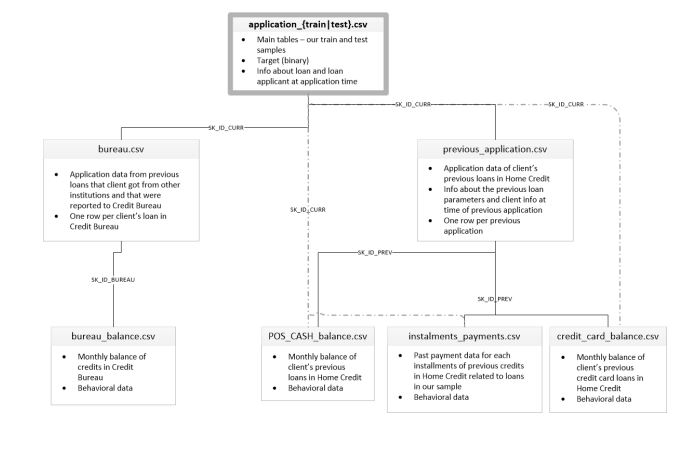

#**Import Libraries**

In [ ]:
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import preprocessing
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from imblearn.under_sampling import RandomUnderSampler

#**Read Dataset**

##**Application test/train & Prev Application**

In [ ]:
df_test = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/application_test.csv')
df_train = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/application_train.csv')

##**Prev App, Pos Cash Installment**

In [ ]:
df_pc = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/POS_CASH_balance.csv')
df_prev = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/previous_application.csv')
df_ins = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/installments_payments.csv')
df_cc = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/credit_card_balance.csv')

##**Bureau**

In [ ]:
df_bu = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/bureau.csv')
df_bb = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/bureau_balance.csv')

#**Grouping**

In [ ]:
df_pc = df_pc.groupby('SK_ID_CURR').last().reset_index()
df_prev = df_prev.groupby('SK_ID_CURR').last().reset_index()
df_ins = df_ins.groupby('SK_ID_CURR').last().reset_index()
df_cc = df_cc.groupby('SK_ID_CURR').last().reset_index()
df_bu = df_bu.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
df_bur = pd.merge(df_bu,df_bb, on='SK_ID_BUREAU',how='left')

#**Merging Prev Appl**



In [ ]:
df_prev1 = df_prev.copy()
df_prev1 = pd.merge(df_prev, df_pc, on='SK_ID_PREV', how ='left')

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_prev1.columns = df_prev1.columns.str.replace('_x$', '_PREV', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_prev1.columns = df_prev1.columns.str.replace('_y$', '_PC', regex=True)

df_prev1.rename(columns={'SK_ID_CURR_PREV': 'SK_ID_CURR'}, inplace=True)

In [ ]:
df_prev1 = df_prev1.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
df_prev1 = pd.merge(df_prev1, df_cc, on='SK_ID_PREV',how='left')

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_prev1.columns = df_prev1.columns.str.replace('_x$', '_PREV', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_prev1.columns = df_prev1.columns.str.replace('_y$', '_CC', regex=True)

df_prev1.rename(columns={'SK_ID_CURR_PREV': 'SK_ID_CURR'}, inplace=True)

In [ ]:
df_prev1 = df_prev1.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
df_prev1 = pd.merge(df_prev1, df_ins, on='SK_ID_PREV',how='left')

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_prev1.columns = df_prev1.columns.str.replace('_x$', '_PREV', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_prev1.columns = df_prev1.columns.str.replace('_y$', '_INS', regex=True)

df_prev1.rename(columns={'SK_ID_CURR_PREV': 'SK_ID_CURR'}, inplace=True)

In [ ]:
df_prev1 = df_prev1.groupby('SK_ID_CURR').last().reset_index()

##**Check the dataframe**

In [ ]:
df_prev1.shape

(338857, 73)

In [ ]:
df_prev1.isna().sum()

SK_ID_CURR                    0
SK_ID_PREV                    0
NAME_CONTRACT_TYPE            0
AMT_ANNUITY                 480
AMT_APPLICATION               0
                          ...  
NUM_INSTALMENT_NUMBER    213450
DAYS_INSTALMENT          213450
DAYS_ENTRY_PAYMENT       213456
AMT_INSTALMENT           213450
AMT_PAYMENT              213456
Length: 73, dtype: int64

since there is so many data with missing value, we will drop it since filling it might causing an overfit model

In [ ]:
df_prev1.dropna(inplace=True)

In [ ]:
df_prev1.isna().sum()

SK_ID_CURR               0.0
SK_ID_PREV               0.0
NAME_CONTRACT_TYPE       0.0
AMT_ANNUITY              0.0
AMT_APPLICATION          0.0
                        ... 
NUM_INSTALMENT_NUMBER    0.0
DAYS_INSTALMENT          0.0
DAYS_ENTRY_PAYMENT       0.0
AMT_INSTALMENT           0.0
AMT_PAYMENT              0.0
Length: 73, dtype: float64

In [ ]:
df_bur.isna().sum()

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE         24953
DAYS_ENDDATE_FACT          289618
AMT_CREDIT_MAX_OVERDUE    1348349
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                  2
AMT_CREDIT_SUM_DEBT        130869
AMT_CREDIT_SUM_LIMIT       422122
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY                683432
MONTHS_BALANCE             171334
STATUS                     171334
dtype: int64

In [ ]:
miss_valb = df_bur.isna().sum()
miss_valpb = (miss_valb/len(df_bur))*100
miss_infob = pd.DataFrame({'COUNT': miss_valb,
                          'PERCENTAGE': miss_valpb}).sort_values('COUNT', ascending=False).reset_index()

In [ ]:
miss_infob.rename({'index': 'FEATURE'}, axis=1, inplace=True)
miss_infob = miss_infob[miss_infob['PERCENTAGE'] < 61]

In [ ]:
daftar = miss_infob['FEATURE'].values.tolist()

In [ ]:
miss_infob['FEATURE'].unique

<bound method Series.unique of 0     AMT_CREDIT_MAX_OVERDUE
1                AMT_ANNUITY
2       AMT_CREDIT_SUM_LIMIT
3          DAYS_ENDDATE_FACT
4                     STATUS
5             MONTHS_BALANCE
6        AMT_CREDIT_SUM_DEBT
7        DAYS_CREDIT_ENDDATE
8             AMT_CREDIT_SUM
9         DAYS_CREDIT_UPDATE
10               CREDIT_TYPE
11    AMT_CREDIT_SUM_OVERDUE
12                SK_ID_CURR
13              SK_ID_BUREAU
14        CREDIT_DAY_OVERDUE
15               DAYS_CREDIT
16           CREDIT_CURRENCY
17             CREDIT_ACTIVE
18        CNT_CREDIT_PROLONG
Name: FEATURE, dtype: object>

In [ ]:
df_bur = df_bur[daftar]

##**Training & Test Dataset**

In [ ]:
df_train1 = df_train.copy()
df_train1 = df_train1.iloc[:, :44]

In [ ]:
df_test1 = df_test.copy()
df_test1 = df_test1.iloc[:, :43]

In [ ]:
df_train1 = pd.merge(df_train1, df_bur,on='SK_ID_CURR',how='left')

In [ ]:
df_test1 = pd.merge(df_test1, df_bur,on='SK_ID_CURR',how='left')

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_train1.columns = df_train1.columns.str.replace('_x$', '', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_train1.columns = df_train1.columns.str.replace('_y$', '_BUREAU', regex=True)

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_test1.columns = df_test1.columns.str.replace('_x$', '', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_test1.columns = df_test1.columns.str.replace('_y$', '_BUREAU', regex=True)

In [ ]:
# df_train1.info(verbose=True)

In [ ]:
df_train1 = df_train1.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
df_test1 = df_test1.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
df_train1.drop('SK_ID_BUREAU',axis=1,inplace=True)

In [ ]:
df_test1.drop('SK_ID_BUREAU',axis=1,inplace=True)

In [ ]:
df_train1.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 61 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [ ]:
df_train1 = pd.merge(df_train1, df_prev1, on='SK_ID_CURR',how='left')
df_train1.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 133 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE_x          object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT_x                  float64
 9    AMT_ANNUITY_x                 float64
 10   AMT_GOODS_PRICE_x             float64
 11   NAME_TYPE_SUITE_x             object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [ ]:
df_test1 = pd.merge(df_test1, df_prev1, on='SK_ID_CURR',how='left')

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_train1.columns = df_train1.columns.str.replace('_x$', '', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_train1.columns = df_train1.columns.str.replace('_y$', '_PREV', regex=True)

In [ ]:
# Mengganti akhiran _x dengan nama yang diinginkan
df_test1.columns = df_test1.columns.str.replace('_x$', '', regex=True)

# Mengganti akhiran _y dengan nama yang diinginkan
df_test1.columns = df_test1.columns.str.replace('_y$', '_PREV', regex=True)

In [ ]:
df_train1 = df_train1.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
df_test1 = df_test1.groupby('SK_ID_CURR').last().reset_index()

In [ ]:
# df_train1.info(verbose=True)

In [ ]:
df_train1.drop('SK_ID_PREV',axis=1,inplace=True)

In [ ]:
df_test1.drop('SK_ID_PREV',axis=1,inplace=True)

In [ ]:
df_train1.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 132 columns):
 #    Column                           Dtype  
---   ------                           -----  
 0    SK_ID_CURR                       int64  
 1    TARGET                           int64  
 2    NAME_CONTRACT_TYPE               object 
 3    CODE_GENDER                      object 
 4    FLAG_OWN_CAR                     object 
 5    FLAG_OWN_REALTY                  object 
 6    CNT_CHILDREN                     int64  
 7    AMT_INCOME_TOTAL                 float64
 8    AMT_CREDIT                       float64
 9    AMT_ANNUITY                      float64
 10   AMT_GOODS_PRICE                  float64
 11   NAME_TYPE_SUITE                  object 
 12   NAME_INCOME_TYPE                 object 
 13   NAME_EDUCATION_TYPE              object 
 14   NAME_FAMILY_STATUS               object 
 15   NAME_HOUSING_TYPE                object 
 16   REGION_POPULATION_RELATIVE       flo

#**Data Preprocessing**

In [ ]:
df_train2 = df_train1.copy()

In [ ]:
df_test2 = df_test1.copy()

In [ ]:
df_test2.shape

(48744, 131)

##**Numeric Column**

In [ ]:
numcol = df_train2.select_dtypes(include=['int64','float64'])
numcol

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CNT_INSTALMENT_MATURE_CUM,SK_DPD_CC,SK_DPD_DEF_CC,SK_ID_CURR_INS,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
remove = ['TARGET','SK_ID_CURR']
numcol = set(numcol) - set(remove)

In [ ]:
# for i in numcol:
#   print(i)

###**Split number column**

In [ ]:
bincol = []
numbcol = []

for num in numcol:
    unique_values = df_train2[num].unique()

    if len(unique_values) == 2:
        bincol.append(num)
    else:
        numbcol.append(num)

In [ ]:
change_col = 'SK_ID_CURR'

df_train2 = pd.DataFrame({change_col: df_train2[change_col].values, **df_train2.drop(columns=change_col)})

df_train2


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,NAME_CONTRACT_STATUS,SK_DPD_CC,SK_DPD_DEF_CC,SK_ID_CURR_INS,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###**Categorical Column**

In [ ]:
def display_categorical_col(df):

    categorical_col = df.select_dtypes(include='object').columns.tolist()


    print("Categorical column:")
    for col in categorical_col:
        print(col)

In [ ]:
# display_categorical_col(df_train2)

In [ ]:
catcol = df_train2.select_dtypes(include='object').columns.tolist()

####**Treat Unknown Values**

In [ ]:
catcol

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'STATUS',
 'CREDIT_TYPE',
 'CREDIT_CURRENCY',
 'CREDIT_ACTIVE',
 'NAME_CONTRACT_TYPE_PREV',
 'WEEKDAY_APPR_PROCESS_START_PREV',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS_PREV',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE_PREV',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION',
 'NAME_CONTRACT_STATUS_PC',
 'NAME_CONTRACT_STATUS']

In [ ]:
df_train2['OCCUPATION_TYPE'].replace({'XNA':'Unemployed'},inplace=True)

In [ ]:
df_test2['OCCUPATION_TYPE'].replace({'XNA':'Unemployed'},inplace=True)

In [ ]:
for cat in catcol:
    # Check if 'XNA' is present in the column
    if 'XNA' in df_train2[cat].values:
        # Calculate the mode of the column
        mode_value = df_train2[cat].mode().iloc[0]

        # Replace 'XNA' with the mode
        df_train2[cat] = df_train2[cat].replace('XNA', mode_value)

In [ ]:
for cat in catcol:
    # Check if 'XNA' is present in the column
    if 'XNA' in df_test2[cat].values:
        # Calculate the mode of the column
        mode_value = df_test2[cat].mode().iloc[0]

        # Replace 'XNA' with the mode
        df_test2[cat] = df_test2[cat].replace('XNA', mode_value)

In [ ]:
for cat in catcol:
    unique_values = df_train2[cat].unique()
    print(f'Unique values for {cat}:')
    for val in unique_values:
        print(val)

Unique values for NAME_CONTRACT_TYPE:
Cash loans
Revolving loans
Unique values for CODE_GENDER:
M
F
Unique values for FLAG_OWN_CAR:
N
Y
Unique values for FLAG_OWN_REALTY:
Y
N
Unique values for NAME_TYPE_SUITE:
Unaccompanied
Family
Spouse, partner
Children
Other_A
None
Other_B
Group of people
Unique values for NAME_INCOME_TYPE:
Working
State servant
Commercial associate
Pensioner
Unemployed
Student
Businessman
Maternity leave
Unique values for NAME_EDUCATION_TYPE:
Secondary / secondary special
Higher education
Incomplete higher
Lower secondary
Academic degree
Unique values for NAME_FAMILY_STATUS:
Single / not married
Married
Civil marriage
Widow
Separated
Unknown
Unique values for NAME_HOUSING_TYPE:
House / apartment
Rented apartment
With parents
Municipal apartment
Office apartment
Co-op apartment
Unique values for OCCUPATION_TYPE:
Laborers
Core staff
Accountants
Managers
None
Drivers
Sales staff
Cleaning staff
Cooking staff
Private service staff
Medicine staff
Security staff
High skil

In [ ]:
# df_train2.info(verbose=True)

####**Split category column**

In [ ]:
yncol = []
mvcol = []

for cat in catcol:
    unique_values = df_train2[cat].unique()

    if len(unique_values) == 2:
      yncol.append(cat)
    else:
      mvcol.append(cat)

In [ ]:
yncol

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']

In [ ]:
mvcol

['NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'STATUS',
 'CREDIT_TYPE',
 'CREDIT_CURRENCY',
 'CREDIT_ACTIVE',
 'NAME_CONTRACT_TYPE_PREV',
 'WEEKDAY_APPR_PROCESS_START_PREV',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS_PREV',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE_PREV',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION',
 'NAME_CONTRACT_STATUS_PC',
 'NAME_CONTRACT_STATUS']

In [ ]:
change_col = 'SK_ID_CURR'


df_train2 = pd.DataFrame({change_col: df_train2[change_col].values, **df_train2.drop(columns=change_col)})

df_train2

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,NAME_CONTRACT_STATUS,SK_DPD_CC,SK_DPD_DEF_CC,SK_ID_CURR_INS,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
change_col = 'SK_ID_CURR'


df_test2 = pd.DataFrame({change_col: df_test2[change_col].values, **df_test2.drop(columns=change_col)})

##**Percenting missing value**

In [ ]:
miss_val = df_train2.isna().sum()
miss_valp = (miss_val/len(df_train2))*100
miss_info = pd.DataFrame({'COUNT': miss_val,
                          'PERCENTAGE': miss_valp}).sort_values('COUNT', ascending=False).reset_index()

In [ ]:
miss_info.rename({'index': 'FEATURE'}, axis=1, inplace=True)
miss_info = miss_info[miss_info['PERCENTAGE'] > 61]

In [ ]:
miss_val1 = df_test2.isna().sum()
miss_valp1 = (miss_val1/len(df_test2))*100
miss_info1 = pd.DataFrame({'COUNT': miss_val1,
                          'PERCENTAGE': miss_valp1}).sort_values('COUNT', ascending=False).reset_index()

In [ ]:
miss_info1.rename({'index': 'FEATURE'}, axis=1, inplace=True)
miss_info1 = miss_info1[miss_info1['PERCENTAGE'] > 61]

In [ ]:
mval = [i for i in miss_info['FEATURE']]

In [ ]:
mval1 = [i for i in miss_info1['FEATURE']]

##**Treat Missing Value**

In [ ]:
df_train2.drop(columns=mval, inplace=True)

In [ ]:
pd.set_option('display.max_rows', None)


print(df_train2.isna().sum())

pd.reset_option('display.max_rows')


SK_ID_CURR                          0
TARGET                              0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                        12
AMT_GOODS_PRICE                   278
NAME_TYPE_SUITE                  1292
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
FLAG_MOBIL                          0
FLAG_EMP_PHONE                      0
FLAG_WORK_PHONE                     0
FLAG_CONT_MOBILE                    0
FLAG_PHONE                          0
FLAG_EMAIL  

In [ ]:
df_train2['OCCUPATION_TYPE'].fillna('Unemployed',inplace=True)

In [ ]:
pd.set_option('display.max_rows', None)


print(df_train2.isna().sum())

pd.reset_option('display.max_rows')


SK_ID_CURR                          0
TARGET                              0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                        12
AMT_GOODS_PRICE                   278
NAME_TYPE_SUITE                  1292
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
FLAG_MOBIL                          0
FLAG_EMP_PHONE                      0
FLAG_WORK_PHONE                     0
FLAG_CONT_MOBILE                    0
FLAG_PHONE                          0
FLAG_EMAIL  

In [ ]:
pd.set_option('display.max_rows', None)


print(df_test2.isna().sum())

pd.reset_option('display.max_rows')

SK_ID_CURR                             0
NAME_CONTRACT_TYPE                     0
CODE_GENDER                            0
FLAG_OWN_CAR                           0
FLAG_OWN_REALTY                        0
CNT_CHILDREN                           0
AMT_INCOME_TOTAL                       0
AMT_CREDIT                             0
AMT_ANNUITY                           24
AMT_GOODS_PRICE                        0
NAME_TYPE_SUITE                      911
NAME_INCOME_TYPE                       0
NAME_EDUCATION_TYPE                    0
NAME_FAMILY_STATUS                     0
NAME_HOUSING_TYPE                      0
REGION_POPULATION_RELATIVE             0
DAYS_BIRTH                             0
DAYS_EMPLOYED                          0
DAYS_REGISTRATION                      0
DAYS_ID_PUBLISH                        0
OWN_CAR_AGE                        32312
FLAG_MOBIL                             0
FLAG_EMP_PHONE                         0
FLAG_WORK_PHONE                        0
FLAG_CONT_MOBILE

In [ ]:
df_test2['OCCUPATION_TYPE'].fillna('Unemployed',inplace=True)

In [ ]:
pd.set_option('display.max_rows', None)


print(df_test2.isna().sum())

pd.reset_option('display.max_rows')

SK_ID_CURR                             0
NAME_CONTRACT_TYPE                     0
CODE_GENDER                            0
FLAG_OWN_CAR                           0
FLAG_OWN_REALTY                        0
CNT_CHILDREN                           0
AMT_INCOME_TOTAL                       0
AMT_CREDIT                             0
AMT_ANNUITY                           24
AMT_GOODS_PRICE                        0
NAME_TYPE_SUITE                      911
NAME_INCOME_TYPE                       0
NAME_EDUCATION_TYPE                    0
NAME_FAMILY_STATUS                     0
NAME_HOUSING_TYPE                      0
REGION_POPULATION_RELATIVE             0
DAYS_BIRTH                             0
DAYS_EMPLOYED                          0
DAYS_REGISTRATION                      0
DAYS_ID_PUBLISH                        0
OWN_CAR_AGE                        32312
FLAG_MOBIL                             0
FLAG_EMP_PHONE                         0
FLAG_WORK_PHONE                        0
FLAG_CONT_MOBILE

In [ ]:
df_test2.drop(columns=mval1, inplace=True)

In [ ]:
df_train2['EXT_SOURCE_1'].fillna(0,inplace=True)
df_train2['EXT_SOURCE_2'].fillna(0,inplace=True)
df_train2['EXT_SOURCE_3'].fillna(0,inplace=True)

In [ ]:
df_test2['EXT_SOURCE_1'].fillna(0,inplace=True)
df_test2['EXT_SOURCE_2'].fillna(0,inplace=True)
df_test2['EXT_SOURCE_3'].fillna(0,inplace=True)

###**Multinumeric**

In [ ]:
def fill_numeric_columns_with_median(dataframe, numeric_columns):
    for column in numeric_columns:
        if column in dataframe.columns and dataframe[column].isnull().any():
            median_value = dataframe[column].median()
            dataframe[column].fillna(median_value, inplace=True)
        else:
            pass

    return dataframe

In [ ]:
fill_numeric_columns_with_median(df_train2,numbcol)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DAYS_CREDIT_ENDDATE,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,CREDIT_TYPE,AMT_CREDIT_SUM_OVERDUE,CREDIT_DAY_OVERDUE,DAYS_CREDIT,CREDIT_CURRENCY,CREDIT_ACTIVE,CNT_CREDIT_PROLONG
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,62.0,67500.000,-758.0,Credit card,0.0,0.0,-1043.0,currency 1,Closed,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,1216.0,810000.000,-43.0,Credit card,0.0,0.0,-606.0,currency 1,Active,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,-382.0,94537.800,-382.0,Consumer credit,0.0,0.0,-408.0,currency 1,Closed,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,-97.0,132801.075,-152.0,None,0.0,0.0,-718.0,None,None,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,-783.0,146250.000,-783.0,Consumer credit,0.0,0.0,-1149.0,currency 1,Closed,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,-97.0,132801.075,-152.0,None,0.0,0.0,-718.0,None,None,0.0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,-97.0,132801.075,-152.0,None,0.0,0.0,-718.0,None,None,0.0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,1113.0,2250000.000,-5.0,Consumer credit,0.0,0.0,-713.0,currency 1,Active,0.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,-859.0,45000.000,-401.0,Consumer credit,0.0,0.0,-1104.0,currency 1,Closed,0.0


In [ ]:
fill_numeric_columns_with_median(df_test2,numbcol)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,DAYS_CREDIT_ENDDATE,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,CREDIT_TYPE,AMT_CREDIT_SUM_OVERDUE,CREDIT_DAY_OVERDUE,DAYS_CREDIT,CREDIT_CURRENCY,CREDIT_ACTIVE,CNT_CREDIT_PROLONG
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,411.0,168345.00,-10.0,Consumer credit,0.0,0.0,-320.0,currency 1,Active,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,122.0,29826.00,-31.0,Consumer credit,0.0,0.0,-62.0,currency 1,Active,0.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,-567.0,1262250.00,-549.0,Car loan,0.0,0.0,-1665.0,currency 1,Closed,0.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,-688.0,105750.00,-682.0,Credit card,0.0,0.0,-1102.0,currency 1,Closed,0.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,-459.0,117000.00,-470.5,None,0.0,0.0,-1087.0,None,None,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,495.0,488070.00,-27.0,Consumer credit,0.0,0.0,-601.0,currency 1,Active,0.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,-459.0,117000.00,-470.5,None,0.0,0.0,-1087.0,None,None,0.0
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,-13.0,50547.96,-45.0,Credit card,0.0,0.0,-229.0,currency 1,Active,0.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,-2497.0,14895.00,-1673.0,Consumer credit,0.0,0.0,-2679.0,currency 1,Closed,0.0


In [ ]:
df_train2.isna().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                        0
AMT_GOODS_PRICE                    0
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
FLAG_EMAIL                         0
O

###**Binary numerical column**

In [ ]:
def fill_binary_columns_with_mode(dataframe):
    # Isi setiap kolom biner dengan mode
    for col in bincol:
        mode_value = dataframe[col].mode()[0]
        dataframe[col].fillna(mode_value, inplace=True)

    return dataframe

In [ ]:
fill_binary_columns_with_mode(df_train2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DAYS_CREDIT_ENDDATE,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,CREDIT_TYPE,AMT_CREDIT_SUM_OVERDUE,CREDIT_DAY_OVERDUE,DAYS_CREDIT,CREDIT_CURRENCY,CREDIT_ACTIVE,CNT_CREDIT_PROLONG
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,62.0,67500.000,-758.0,Credit card,0.0,0.0,-1043.0,currency 1,Closed,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,1216.0,810000.000,-43.0,Credit card,0.0,0.0,-606.0,currency 1,Active,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,-382.0,94537.800,-382.0,Consumer credit,0.0,0.0,-408.0,currency 1,Closed,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,-97.0,132801.075,-152.0,None,0.0,0.0,-718.0,None,None,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,-783.0,146250.000,-783.0,Consumer credit,0.0,0.0,-1149.0,currency 1,Closed,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,-97.0,132801.075,-152.0,None,0.0,0.0,-718.0,None,None,0.0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,-97.0,132801.075,-152.0,None,0.0,0.0,-718.0,None,None,0.0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,1113.0,2250000.000,-5.0,Consumer credit,0.0,0.0,-713.0,currency 1,Active,0.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,-859.0,45000.000,-401.0,Consumer credit,0.0,0.0,-1104.0,currency 1,Closed,0.0


In [ ]:
bincol1 = set(bincol) - set(['TARGET'])
bincol1 = list(bincol1)

In [ ]:
def fill_binary1_columns_with_mode(dataframe):
    # Isi setiap kolom biner dengan mode
    for col in bincol1:
        mode_value = dataframe[col].mode()[0]
        dataframe[col].fillna(mode_value, inplace=True)

    return dataframe

In [ ]:
fill_binary1_columns_with_mode(df_test2)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,DAYS_CREDIT_ENDDATE,AMT_CREDIT_SUM,DAYS_CREDIT_UPDATE,CREDIT_TYPE,AMT_CREDIT_SUM_OVERDUE,CREDIT_DAY_OVERDUE,DAYS_CREDIT,CREDIT_CURRENCY,CREDIT_ACTIVE,CNT_CREDIT_PROLONG
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,411.0,168345.00,-10.0,Consumer credit,0.0,0.0,-320.0,currency 1,Active,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,122.0,29826.00,-31.0,Consumer credit,0.0,0.0,-62.0,currency 1,Active,0.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,-567.0,1262250.00,-549.0,Car loan,0.0,0.0,-1665.0,currency 1,Closed,0.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,-688.0,105750.00,-682.0,Credit card,0.0,0.0,-1102.0,currency 1,Closed,0.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,-459.0,117000.00,-470.5,None,0.0,0.0,-1087.0,None,None,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,495.0,488070.00,-27.0,Consumer credit,0.0,0.0,-601.0,currency 1,Active,0.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,-459.0,117000.00,-470.5,None,0.0,0.0,-1087.0,None,None,0.0
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,-13.0,50547.96,-45.0,Credit card,0.0,0.0,-229.0,currency 1,Active,0.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,-2497.0,14895.00,-1673.0,Consumer credit,0.0,0.0,-2679.0,currency 1,Closed,0.0


In [ ]:
df_train2[bincol].isna().sum()

FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
FLAG_EMP_PHONE                 0
FLAG_MOBIL                     0
REG_REGION_NOT_LIVE_REGION     0
REG_CITY_NOT_WORK_CITY         0
REG_REGION_NOT_WORK_REGION     0
LIVE_CITY_NOT_WORK_CITY        0
dtype: int64

In [ ]:
df_test2[bincol1].isna().sum()

FLAG_WORK_PHONE                0
FLAG_PHONE                     0
REG_REGION_NOT_WORK_REGION     0
REG_CITY_NOT_WORK_CITY         0
FLAG_EMP_PHONE                 0
FLAG_MOBIL                     0
FLAG_EMAIL                     0
REG_REGION_NOT_LIVE_REGION     0
LIVE_CITY_NOT_WORK_CITY        0
FLAG_CONT_MOBILE               0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
dtype: int64

In [ ]:
mvcol

['NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'STATUS',
 'CREDIT_TYPE',
 'CREDIT_CURRENCY',
 'CREDIT_ACTIVE',
 'NAME_CONTRACT_TYPE_PREV',
 'WEEKDAY_APPR_PROCESS_START_PREV',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS_PREV',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE_PREV',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION',
 'NAME_CONTRACT_STATUS_PC',
 'NAME_CONTRACT_STATUS']

###**Treat all train & test data**

In [ ]:
for col in mvcol:
        if col in df_train2.columns and df_train2[col].isna().any():
            mode_values = df_train2[col].mode()
            if not mode_values.empty:
                mode_value = mode_values.iloc[0]
                df_train2[col].fillna(mode_value, inplace=True)

In [ ]:
for col in mvcol:
        if col in df_test2.columns and df_test2[col].isna().any():
            mode_values = df_test2[col].mode()
            if not mode_values.empty:
                mode_value = mode_values.iloc[0]
                df_test2[col].fillna(mode_value, inplace=True)

###**Recheck**

####**Redefine**

In [ ]:
df_train3 = df_train2.copy()

In [ ]:
df_test3 = df_test2.copy()

#####**Catcol**

#####**Train**

In [ ]:
catcol = df_train3.select_dtypes(include='object').columns.tolist()

In [ ]:
df_train2['NAME_FAMILY_STATUS'].unique()

array(['Single / not married', 'Married', 'Civil marriage', 'Widow',
       'Separated', 'Unknown'], dtype=object)

In [ ]:
yncol = []
mvcol = []

for cat in catcol:
    unique_values = df_train2[cat].unique()

    if len(unique_values) == 2:
      yncol.append(cat)
    else:
      mvcol.append(cat)

In [ ]:
yncol = yncol

In [ ]:
mvcol

['NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'CREDIT_TYPE',
 'CREDIT_CURRENCY',
 'CREDIT_ACTIVE']

In [ ]:
df_train3['NAME_CONTRACT_TYPE'].unique()

array(['Cash loans', 'Revolving loans'], dtype=object)

In [ ]:
yncol

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']

#####**Numcol**

In [ ]:
numcol = df_train2.select_dtypes(include=['float64','int64']).columns.tolist()

In [ ]:
bincol = []
numbcol = []

for num in numcol:
    unique_values = df_train2[num].unique()

    if len(unique_values) == 2:
        bincol.append(num)
    else:
        numbcol.append(num)

In [ ]:
for yn in yncol:
    unique_values = df_train2[yn].unique()
    print(f'Unique values for {yn}:')
    for yn in unique_values:
        print(yn)

Unique values for NAME_CONTRACT_TYPE:
Cash loans
Revolving loans
Unique values for CODE_GENDER:
M
F
Unique values for FLAG_OWN_CAR:
N
Y
Unique values for FLAG_OWN_REALTY:
Y
N


In [ ]:
for mv in mvcol:
    unique_values = df_train2[mv].unique()
    print(f'Unique values for {mv}:')
    for mv in unique_values:
        print(mv)

Unique values for NAME_TYPE_SUITE:
Unaccompanied
Family
Spouse, partner
Children
Other_A
Other_B
Group of people
Unique values for NAME_INCOME_TYPE:
Working
State servant
Commercial associate
Pensioner
Unemployed
Student
Businessman
Maternity leave
Unique values for NAME_EDUCATION_TYPE:
Secondary / secondary special
Higher education
Incomplete higher
Lower secondary
Academic degree
Unique values for NAME_FAMILY_STATUS:
Single / not married
Married
Civil marriage
Widow
Separated
Unknown
Unique values for NAME_HOUSING_TYPE:
House / apartment
Rented apartment
With parents
Municipal apartment
Office apartment
Co-op apartment
Unique values for OCCUPATION_TYPE:
Laborers
Core staff
Accountants
Managers
Unemployed
Drivers
Sales staff
Cleaning staff
Cooking staff
Private service staff
Medicine staff
Security staff
High skill tech staff
Waiters/barmen staff
Low-skill Laborers
Realty agents
Secretaries
IT staff
HR staff
Unique values for WEEKDAY_APPR_PROCESS_START:
WEDNESDAY
MONDAY
THURSDAY
SUNDA

In [ ]:
to_drop1 = ['CREDIT_CURRENCY','STATUS','WEEKDAY_APPR_PROCESS_START']
mvcol = set(mvcol) - set(to_drop1)
mvcol = list(mvcol)

In [ ]:
mvcol

['NAME_EDUCATION_TYPE',
 'NAME_TYPE_SUITE',
 'NAME_FAMILY_STATUS',
 'CREDIT_ACTIVE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE',
 'CREDIT_TYPE',
 'NAME_INCOME_TYPE',
 'NAME_HOUSING_TYPE']

In [ ]:
yncol

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']

In [ ]:
# catcol1 = [mvcol] + [yncol]

In [ ]:
# catcol1

###**Treat Marital Status**

In [ ]:
df_train3['NAME_FAMILY_STATUS'].replace({"Unknown": 'Unmarried'}, inplace=True)

df_train3['NAME_FAMILY_STATUS'].replace({
    'Single / not married': 'Unmarried',
    'Widow': 'Unmarried',
    'Separated': 'Unmarried',
    "Civil marriage": "Married"
}, inplace=True)
# .mode()[0]

In [ ]:
df_test3['NAME_FAMILY_STATUS'].replace({"Unknown": 'Unmarried'}, inplace=True)

df_test3['NAME_FAMILY_STATUS'].replace({
    'Single / not married': 'Unmarried',
    'Widow': 'Unmarried',
    'Separated': 'Unmarried',
    "Civil marriage": "Married"
}, inplace=True)
# .mode()[0]

###**Treat Education Type**

Replace Lower secondary, incomplete higher to Secondary and academic degree to bachelor

In [ ]:
# Replace other values as specified
df_train3['NAME_EDUCATION_TYPE'].replace({
    'Lower secondary': 'Secondary',
    'Secondary / secondary special': 'Secondary',
    'Incomplete higher': 'Higher education',
    'Academic degree': 'Bachelor'
}, inplace=True)

In [ ]:
# Replace other values as specified
df_test3['NAME_EDUCATION_TYPE'].replace({
    'Lower secondary': 'Secondary',
    'Secondary / secondary special': 'Secondary',
    'Incomplete higher': 'Higher education',
    'Academic degree': 'Bachelor'
}, inplace=True)

In [ ]:
df_train2.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [ ]:
for mv in mvcol:
  print(mv)

NAME_EDUCATION_TYPE
NAME_TYPE_SUITE
NAME_FAMILY_STATUS
CREDIT_ACTIVE
OCCUPATION_TYPE
ORGANIZATION_TYPE
CREDIT_TYPE
NAME_INCOME_TYPE
NAME_HOUSING_TYPE


In [ ]:
df_check = df_train3.copy()

In [ ]:
df_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

#**EDA**

##**Class Distribution**

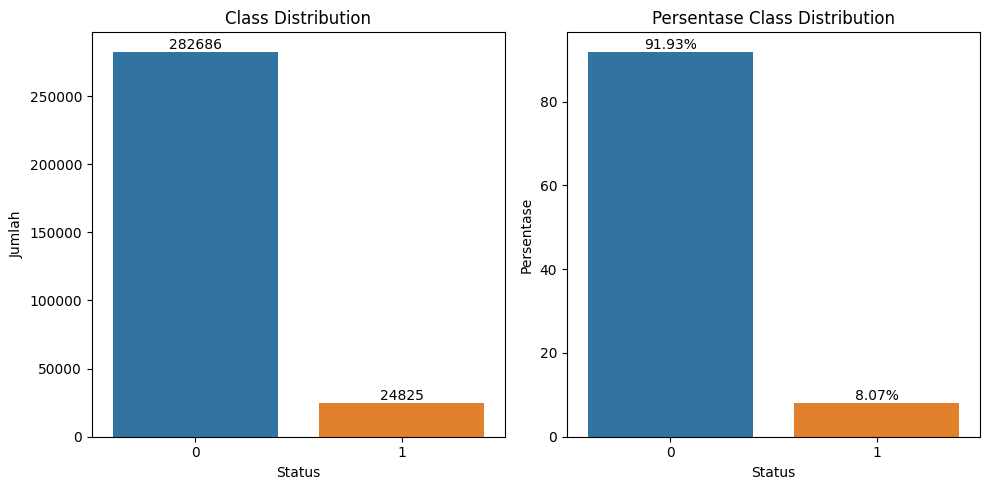

In [ ]:
# Grup berdasarkan 'TARGET' dan menghitung jumlah 'SK_ID_CURR' di setiap grup
result = df_check.groupby(['TARGET'])[['SK_ID_CURR']].agg('count').reset_index()
result = result.rename(columns={'SK_ID_CURR': 'Jumlah'})

# Menghitung persentase
result['Persentase'] = result['Jumlah'] / result['Jumlah'].sum() * 100

# Membuat subplot dengan dua bar plot
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Bar plot untuk jumlah mutlak
sns.barplot(x='TARGET', y='Jumlah', data=result, ax=axes[0])
axes[0].set_title('Class Distribution')
axes[0].set_xlabel('Status')
axes[0].set_ylabel('Jumlah')

# Menambahkan anotasi pada setiap batang (jumlah mutlak)
for p in axes[0].patches:
    height = p.get_height()
    axes[0].annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

# Bar plot untuk persentase
sns.barplot(x='TARGET', y='Persentase', data=result, ax=axes[1])
axes[1].set_title('Persentase Class Distribution')
axes[1].set_xlabel('Status')
axes[1].set_ylabel('Persentase')

# Menambahkan anotasi pada setiap batang (persentase)
for p in axes[1].patches:
    height = p.get_height()
    axes[1].annotate(f'{height:.2f}%', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

# Menampilkan plot
plt.tight_layout()
plt.show()

the data is highly imbalanced so we will do resampling before creating the model

###**Manipulate days**

In [ ]:
df_train3['AGE'] = (df_train3['DAYS_BIRTH'] / -365).round()
df_train3['WORK_EXP'] = (df_train3['DAYS_EMPLOYED'] / 365).round()
df_train3['WORK_EXP'] = df_train3['WORK_EXP'].abs()
df_train3['YEAR_REGISTER'] = (df_train3['DAYS_REGISTRATION'] / -365).round()

In [ ]:
tba = ['DAYS_CREDIT','DAYS_CREDIT_ENDDATE','DAYS_ENDDATE_FACT','DAYS_CREDIT_UPDATE']
df_train3['YEAR_CREDIT'] = (df_train3['DAYS_CREDIT'] / 365).round().abs()
df_train3['YEAR_CREDIT_ENDDATE'] = (df_train3['DAYS_CREDIT_ENDDATE'] /365).round().abs()
df_train3['YEAR_ENDDATE_FACT'] = (df_train3['DAYS_ENDDATE_FACT'] / 365).round().abs()
df_train3['YEAR_CREDIT_UPDATE'] = (df_train3['DAYS_CREDIT_UPDATE'] / 365).round().abs()

yra =  ['YEAR_CREDIT',	'YEAR_CREDIT_ENDDATE',	'YEAR_ENDDATE_FACT',	'YEAR_CREDIT_UPDATE']
df_train3.drop(tba, axis=1, inplace=True)

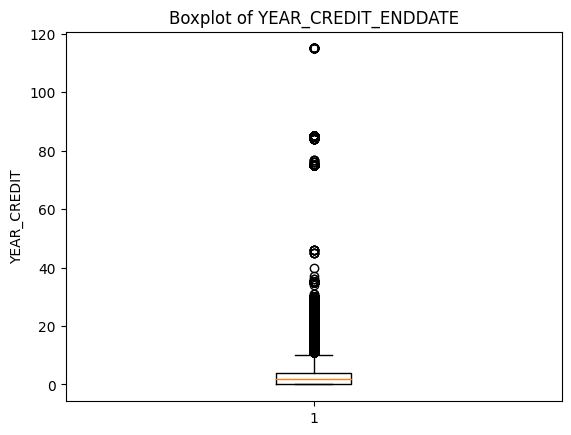

In [ ]:
plt.boxplot(df_train3['YEAR_CREDIT_ENDDATE'])  # Dropna is used to handle any missing values
plt.title('Boxplot of YEAR_CREDIT_ENDDATE')
plt.ylabel('YEAR_CREDIT')
plt.show()

There is anomaly in year credit enddate (120 years) so we will limit to 45 years maximum

In [ ]:
df_test3['AGE'] = (df_test3['DAYS_BIRTH'] / -365).round()
df_test3['WORK_EXP'] = (df_test3['DAYS_EMPLOYED'] / 365).round()
df_test3['WORK_EXP'] = df_test3['WORK_EXP'].abs()
df_test3['YEAR_REGISTER'] = (df_test3['DAYS_REGISTRATION'] / -365).round()

In [ ]:
tba = ['DAYS_CREDIT','DAYS_CREDIT_ENDDATE','DAYS_ENDDATE_FACT','DAYS_CREDIT_UPDATE']
df_test3['YEAR_CREDIT'] = (df_test3['DAYS_CREDIT'] / 365).round().abs()
df_test3['YEAR_CREDIT_ENDDATE'] = (df_test3['DAYS_CREDIT_ENDDATE'] /365).round().abs()
df_test3['YEAR_ENDDATE_FACT'] = (df_test3['DAYS_ENDDATE_FACT'] / 365).round().abs()
df_test3['YEAR_CREDIT_UPDATE'] = (df_test3['DAYS_CREDIT_UPDATE'] / 365).round().abs()

yra =  ['YEAR_CREDIT',	'YEAR_CREDIT_ENDDATE',	'YEAR_ENDDATE_FACT',	'YEAR_CREDIT_UPDATE']
df_test3.drop(tba, axis=1, inplace=True)

In [ ]:
df_train3['YEAR_REGISTER']

0         10.0
1          3.0
2         12.0
3         27.0
4         12.0
          ... 
307506    23.0
307507    12.0
307508    18.0
307509     7.0
307510    14.0
Name: YEAR_REGISTER, Length: 307511, dtype: float64

In [ ]:
df_train3['WORK_EXP'] = df_train3['WORK_EXP'][df_train3['WORK_EXP'] <= 65]

In [ ]:
df_test3['WORK_EXP'] = df_test3['WORK_EXP'][df_test3['WORK_EXP'] <= 65]

In [ ]:
df_test3['YEAR_ENDDATE_FACT'] = df_test3['YEAR_ENDDATE_FACT'][df_test3['YEAR_ENDDATE_FACT'] <= 40]

In [ ]:
df_train3['YEAR_ENDDATE_FACT'] = df_train3['YEAR_ENDDATE_FACT'][df_train3['YEAR_ENDDATE_FACT'] <= 40]

In [ ]:
med = df_train3['WORK_EXP'].median()

df_train3['WORK_EXP'].fillna(med, inplace=True)

In [ ]:
med1 = df_test3['WORK_EXP'].median()

df_test3['WORK_EXP'].fillna(med1, inplace=True)

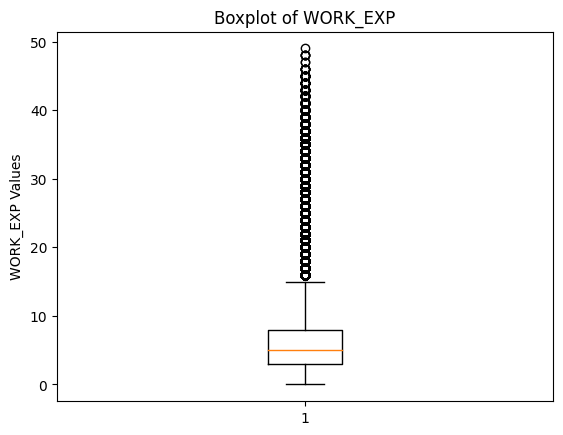

In [ ]:
plt.boxplot(df_train3['WORK_EXP'].dropna())  # Dropna is used to handle any missing values
plt.title('Boxplot of WORK_EXP')
plt.ylabel('WORK_EXP Values')
plt.show()

we will do the same as credit time

In [ ]:
df_check = df_train3.copy()

In [ ]:
df_train3['WORK_EXP'].max()

49.0

In [ ]:
numcol = numcol + ['AGE', 'WORK_EXP','YEAR_REGISTER']
numcol = list(set(numcol)-set(tba))
numcol = numcol + yra

In [ ]:
numcol

['FLAG_WORK_PHONE',
 'CREDIT_DAY_OVERDUE',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'DAYS_EMPLOYED',
 'REGION_RATING_CLIENT_W_CITY',
 'FLAG_CONT_MOBILE',
 'AMT_CREDIT_SUM',
 'AMT_INCOME_TOTAL',
 'AGE',
 'CNT_CHILDREN',
 'FLAG_MOBIL',
 'REG_REGION_NOT_LIVE_REGION',
 'CNT_CREDIT_PROLONG',
 'DAYS_REGISTRATION',
 'FLAG_PHONE',
 'HOUR_APPR_PROCESS_START',
 'EXT_SOURCE_3',
 'REGION_POPULATION_RELATIVE',
 'SK_ID_CURR',
 'REG_CITY_NOT_WORK_CITY',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_ID_PUBLISH',
 'FLAG_EMAIL',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_DEBT',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'AMT_ANNUITY',
 'YEAR_REGISTER',
 'AMT_CREDIT_MAX_OVERDUE',
 'REG_REGION_NOT_WORK_REGION',
 'EXT_SOURCE_1',
 'DAYS_BIRTH',
 'WORK_EXP',
 'FLAG_EMP_PHONE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'TARGET',
 'YEAR_CREDIT',
 'YEAR_CREDIT_ENDDATE',
 'YEAR_ENDDATE_FACT',
 'YEAR_CREDIT_UPDATE']

**The Class Distribution is highly Imbalanced, we will use recall score for minimizing FN rate**

###**One-Hot Encoding**

In [ ]:
# Bivariate treatment
df_train3['CODE_GENDER'].replace({'M': 0, 'F': 1}, inplace=True)
df_train3['FLAG_OWN_CAR'].replace({'N': 0, 'Y': 1}, inplace=True)
df_train3['FLAG_OWN_REALTY'].replace({'N': 0, 'Y': 1}, inplace=True)
df_train3['NAME_FAMILY_STATUS'].replace({'Unmarried': 0, 'Married': 1}, inplace=True)

# Multivariate treatment
df_train3['NAME_EDUCATION_TYPE'].replace({'Secondary': 1, 'Higher education': 2, 'Bachelor': 3}, inplace=True)

In [ ]:
# Bivariate treatment
df_test3['CODE_GENDER'].replace({'M': 0, 'F': 1}, inplace=True)
df_test3['FLAG_OWN_CAR'].replace({'N': 0, 'Y': 1}, inplace=True)
df_test3['FLAG_OWN_REALTY'].replace({'N': 0, 'Y': 1}, inplace=True)
df_test3['NAME_FAMILY_STATUS'].replace({'Unmarried': 0, 'Married': 1}, inplace=True)

# Multivariate treatment
df_test3['NAME_EDUCATION_TYPE'].replace({'Secondary': 1, 'Higher education': 2, 'Bachelor': 3}, inplace=True)

In [ ]:
df_train3.drop(['DAYS_BIRTH', 'DAYS_EMPLOYED','DAYS_ID_PUBLISH','DAYS_REGISTRATION','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START'], axis=1, inplace=True)

In [ ]:
df_test3.drop(['DAYS_BIRTH', 'DAYS_EMPLOYED','DAYS_ID_PUBLISH','DAYS_REGISTRATION','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START'], axis=1, inplace=True)

In [ ]:
numcol = set(numcol) - set(['SK_ID_CURR','TARGET','DAYS_BIRTH', 'DAYS_EMPLOYED','DAYS_ID_PUBLISH','DAYS_REGISTRATION','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START','OWN_CAR_AGE'])
numcol = list(numcol)

In [ ]:
yncol = list(set(yncol) - set(['NAME_CONTRACT_TYPE']))

In [ ]:
mvcol = list(set(mvcol) - set(['NAME_FAMILY_STATUS','NAME_EDUCATION_TYPE']))

In [ ]:
df_new = df_train3.copy()
for i in yncol + ['TARGET']:
  df_new[i] = df_new[i].astype('category')
  df_new[i] = df_new[i].cat.codes
  df_new[i] = df_new[i].astype(int)

In [ ]:
df_new1 = df_test3.copy()
for i in yncol:
  df_new1[i] = df_new1[i].astype('category')
  df_new1[i] = df_new1[i].cat.codes
  df_new1[i] = df_new1[i].astype(int)

In [ ]:
# Dummy variable untuk variabel yang category-nya > 2
for i in mvcol:
  dummy_df = pd.get_dummies(df_new, columns=[i], prefix=[i], drop_first = True)
  df_new[i] = df_new[i].astype('category')
  df_new[i] = df_new[i].cat.codes
  df_new[i] = df_new[i].astype(int)
  df_new = df_new.merge(dummy_df)

In [ ]:
# Dummy variable untuk variabel yang category-nya > 2
for i in mvcol:
  dummy_df1 = pd.get_dummies(df_new1, columns=[i], prefix=[i], drop_first = True)
  df_new1[i] = df_new1[i].astype('category')
  df_new1[i] = df_new1[i].cat.codes
  df_new1[i] = df_new1[i].astype(int)
  df_new1 = df_new1.merge(dummy_df1)

In [ ]:
#make coloum that will included in correlation
columns_correlation = set(df_new.columns)- set(['SK_ID_CURR','TARGET'])
columns_correlation = list(columns_correlation)

for i in columns_correlation:
  unique_data = df_new[i].value_counts()
  print(unique_data,'\n')

0    246203
1     61308
Name: FLAG_WORK_PHONE, dtype: int64 

450000.0     26300
225000.0     25282
675000.0     24962
900000.0     15416
270000.0     11428
             ...  
1265751.0        1
503266.5         1
810778.5         1
666090.0         1
743863.5         1
Name: AMT_GOODS_PRICE, Length: 1002, dtype: int64 

2.0    90257
1.0    71012
0.0    37594
3.0    32235
4.0    24256
7.0    17714
5.0    14899
6.0    12844
8.0     6700
Name: YEAR_CREDIT, dtype: int64 

0    299680
1      7831
Name: ORGANIZATION_TYPE_Trade: type 7, dtype: int64 

0    307510
1         1
Name: CREDIT_TYPE_Real estate loan, dtype: int64 

0    307310
1       201
Name: ORGANIZATION_TYPE_Transport: type 1, dtype: int64 

2    229484
3     43860
1     34167
Name: REGION_RATING_CLIENT_W_CITY, dtype: int64 

0.0      88252
1.0      60968
2.0      45287
3.0      33461
4.0      27851
5.0      15662
6.0      13016
7.0       7448
85.0      4060
75.0      3056
29.0      1086
28.0       956
27.0       659
8.0       

In [ ]:
yncol

['FLAG_OWN_REALTY', 'CODE_GENDER', 'FLAG_OWN_CAR']

In [ ]:
df_new[columns_correlation].info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 159 columns):
 #    Column                                                    Dtype  
---   ------                                                    -----  
 0    FLAG_WORK_PHONE                                           int64  
 1    AMT_GOODS_PRICE                                           float64
 2    YEAR_CREDIT                                               float64
 3    ORGANIZATION_TYPE_Trade: type 7                           uint8  
 4    CREDIT_TYPE_Real estate loan                              uint8  
 5    ORGANIZATION_TYPE_Transport: type 1                       uint8  
 6    REGION_RATING_CLIENT_W_CITY                               int64  
 7    YEAR_CREDIT_ENDDATE                                       float64
 8    ORGANIZATION_TYPE_Trade: type 6                           uint8  
 9    FLAG_OWN_CAR                                              int64  
 10   CREDIT_TYPE_Consum

In [ ]:
# df_new.info(verbose=True)

##**Correlation**

<ipython-input-160-a06a3ca86875>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_new[columns_correlation].corr(), dtype=np.bool))
<ipython-input-160-a06a3ca86875>:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_new[columns_correlation].corr(), dtype=np.bool))
<ipython-input-160-a06a3ca86875>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to sil

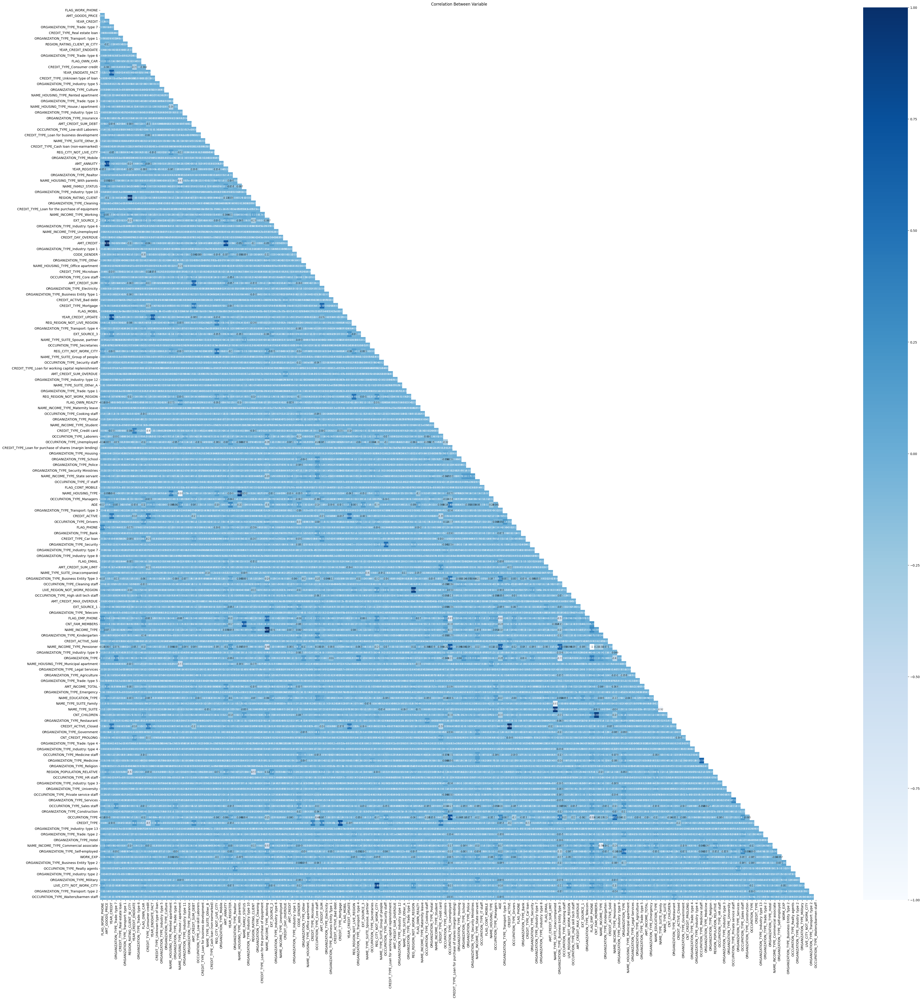

In [ ]:
fig = plt.figure(figsize=(50,50))

ax = fig.add_subplot(1, 1, 1)
ax.set_title('Correlation Between Variable')

mask = np.triu(np.ones_like(
    df_new[columns_correlation].corr(), dtype=np.bool))

sns.heatmap(df_new[columns_correlation].corr()
            ,vmin=-1
            ,vmax=1
            ,cmap='Blues'
            ,annot=True
            ,mask=mask
            ,annot_kws={"fontsize":7})

plt.show()

In [ ]:
columns_correlation

['FLAG_WORK_PHONE',
 'AMT_GOODS_PRICE',
 'YEAR_CREDIT',
 'ORGANIZATION_TYPE_Trade: type 7',
 'CREDIT_TYPE_Real estate loan',
 'ORGANIZATION_TYPE_Transport: type 1',
 'REGION_RATING_CLIENT_W_CITY',
 'YEAR_CREDIT_ENDDATE',
 'ORGANIZATION_TYPE_Trade: type 6',
 'FLAG_OWN_CAR',
 'CREDIT_TYPE_Consumer credit',
 'YEAR_ENDDATE_FACT',
 'CREDIT_TYPE_Unknown type of loan',
 'ORGANIZATION_TYPE_Industry: type 5',
 'ORGANIZATION_TYPE_Culture',
 'NAME_HOUSING_TYPE_Rented apartment',
 'ORGANIZATION_TYPE_Trade: type 3',
 'NAME_HOUSING_TYPE_House / apartment',
 'ORGANIZATION_TYPE_Industry: type 11',
 'ORGANIZATION_TYPE_Insurance',
 'AMT_CREDIT_SUM_DEBT',
 'OCCUPATION_TYPE_Low-skill Laborers',
 'CREDIT_TYPE_Loan for business development',
 'NAME_TYPE_SUITE_Other_B',
 'CREDIT_TYPE_Cash loan (non-earmarked)',
 'REG_CITY_NOT_LIVE_CITY',
 'ORGANIZATION_TYPE_Mobile',
 'AMT_ANNUITY',
 'YEAR_REGISTER',
 'ORGANIZATION_TYPE_Realtor',
 'NAME_HOUSING_TYPE_With parents',
 'NAME_FAMILY_STATUS',
 'ORGANIZATION_TYPE_In

In [ ]:
df_new['NAME_EDUCATION_TYPE'].unique()

array([1, 2, 3])

In [ ]:
# Create new matrix
corr_matrix = df_new[columns_correlation].corr().abs()

# corr_matrix
# Select upper triangle of new matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with new greater than 0.7, and add into to_drop list
to_drop = [column for column in upper.columns if any(upper[column] > 0.7)]
to_drop

<ipython-input-163-0e0744a41cca>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_new[columns_correlation].corr().abs()
<ipython-input-163-0e0744a41cca>:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))


['AMT_ANNUITY',
 'REGION_RATING_CLIENT',
 'AMT_CREDIT',
 'YEAR_CREDIT_UPDATE',
 'CREDIT_TYPE_Credit card',
 'NAME_HOUSING_TYPE',
 'LIVE_REGION_NOT_WORK_REGION',
 'NAME_INCOME_TYPE',
 'NAME_INCOME_TYPE_Pensioner',
 'ORGANIZATION_TYPE',
 'NAME_TYPE_SUITE_Family',
 'NAME_TYPE_SUITE',
 'CNT_CHILDREN',
 'CREDIT_ACTIVE_Closed',
 'OCCUPATION_TYPE',
 'CREDIT_TYPE',
 'NAME_INCOME_TYPE_Commercial associate',
 'LIVE_CITY_NOT_WORK_CITY']

We have filtered the feature using correlation it will helps in modelling

In [ ]:
to_keep = set(columns_correlation) - set(to_drop)

In [ ]:
numcol

['FLAG_WORK_PHONE',
 'CREDIT_DAY_OVERDUE',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'YEAR_CREDIT',
 'REGION_RATING_CLIENT_W_CITY',
 'FLAG_CONT_MOBILE',
 'AMT_CREDIT_SUM',
 'AMT_INCOME_TOTAL',
 'YEAR_CREDIT_ENDDATE',
 'AGE',
 'CNT_CHILDREN',
 'FLAG_MOBIL',
 'YEAR_ENDDATE_FACT',
 'YEAR_CREDIT_UPDATE',
 'REG_REGION_NOT_LIVE_REGION',
 'CNT_CREDIT_PROLONG',
 'FLAG_PHONE',
 'EXT_SOURCE_3',
 'REGION_POPULATION_RELATIVE',
 'REG_CITY_NOT_WORK_CITY',
 'AMT_CREDIT_SUM_OVERDUE',
 'FLAG_EMAIL',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_DEBT',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'AMT_ANNUITY',
 'YEAR_REGISTER',
 'AMT_CREDIT_MAX_OVERDUE',
 'REG_REGION_NOT_WORK_REGION',
 'EXT_SOURCE_1',
 'WORK_EXP',
 'FLAG_EMP_PHONE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2']

In [ ]:
to_keep

{'AGE',
 'AMT_CREDIT_MAX_OVERDUE',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'AMT_GOODS_PRICE',
 'AMT_INCOME_TOTAL',
 'CNT_CREDIT_PROLONG',
 'CNT_FAM_MEMBERS',
 'CODE_GENDER',
 'CREDIT_ACTIVE',
 'CREDIT_ACTIVE_Bad debt',
 'CREDIT_ACTIVE_Sold',
 'CREDIT_CURRENCY',
 'CREDIT_DAY_OVERDUE',
 'CREDIT_TYPE_Car loan',
 'CREDIT_TYPE_Cash loan (non-earmarked)',
 'CREDIT_TYPE_Consumer credit',
 'CREDIT_TYPE_Loan for business development',
 'CREDIT_TYPE_Loan for purchase of shares (margin lending)',
 'CREDIT_TYPE_Loan for the purchase of equipment',
 'CREDIT_TYPE_Loan for working capital replenishment',
 'CREDIT_TYPE_Microloan',
 'CREDIT_TYPE_Mortgage',
 'CREDIT_TYPE_Real estate loan',
 'CREDIT_TYPE_Unknown type of loan',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'FLAG_CONT_MOBILE',
 'FLAG_EMAIL',
 'FLAG_EMP_PHONE',
 'FLAG_MOBIL',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_PHONE',
 'FLAG_WORK_PHONE',
 'NAME_CONTRACT_TYPE',
 'NAME_EDU

##**EDA 2**

In [ ]:
cat_plot = set(to_keep) - set(numcol)
cat_plot = list(cat_plot)

In [ ]:
df_new[cat_plot].info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 110 columns):
 #    Column                                                    Dtype 
---   ------                                                    ----- 
 0    ORGANIZATION_TYPE_Trade: type 7                           uint8 
 1    CREDIT_TYPE_Real estate loan                              uint8 
 2    ORGANIZATION_TYPE_Transport: type 1                       uint8 
 3    ORGANIZATION_TYPE_Trade: type 6                           uint8 
 4    FLAG_OWN_CAR                                              int64 
 5    CREDIT_TYPE_Consumer credit                               uint8 
 6    OCCUPATION_TYPE_Waiters/barmen staff                      uint8 
 7    CREDIT_TYPE_Unknown type of loan                          uint8 
 8    ORGANIZATION_TYPE_Industry: type 5                        uint8 
 9    ORGANIZATION_TYPE_Culture                                 uint8 
 10   NAME_HOUSING_TYPE_Rented apart

###**Numerical Plot**

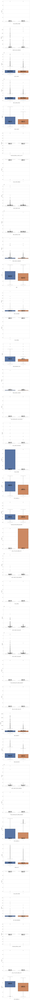

In [ ]:
sns.set(style="whitegrid")
fig, axes = plt.subplots(ncols=1, nrows = len(numcol), figsize = (10,10*len(numcol)))
i = 0
plt.grid(False)
for x in numcol:
    g = sns.boxplot(x='TARGET',y=x,data=df_new, ax=axes[i])
    g.set_xlabel(x,fontsize=15)
    g.set_ylabel("Count",fontsize=15)
    i += 1
    means = df_new.groupby('TARGET')[x].mean().abs()
    medians = df_new.groupby('TARGET')[x].median().abs()
    vertical_offset = df_new[x].mean() *.05
    for xtick in g.get_xticks():
        g.text(xtick,medians[xtick]-vertical_offset,"Mean:"+str(round(means[xtick],2))+'\n'+"Median:"+str(round(medians[xtick],2)), horizontalalignment='center', color='black', weight='semibold')

plt.grid(False)
plt.show(fig)

###**Cat Plot**

In [ ]:
len(cat_plot)

110

In [ ]:
selected_columns = cat_plot[:109]  # Ubah sesuai kebutuhan

sns.set(style="whitegrid", color_codes=True)
fig, axes = plt.subplots(ncols=1, nrows=len(selected_columns), figsize=(15, 5 * len(selected_columns)))
i = 0
for x in selected_columns:
    d = df_new.groupby(x)['TARGET'].value_counts(normalize=True).mul(100).rename('Percentage').reset_index()
    g = sns.barplot(x=x, y='Percentage', hue='TARGET', data=d, ax=axes[i])  # Create bar chart
    g.set_ylim(0, 100)
    g.set_xlabel(x, fontsize=15)
    g.set_ylabel("Percent", fontsize=15)
    i += 1
    for p in g.patches:
        txt = str(p.get_height().round(2)) + '%'
        txt_x = p.get_x() + p.get_width() / 2
        txt_y = p.get_height()
        g.text(txt_x, txt_y + 1, txt)  # Printing percentages on the bars

plt.grid(False)
plt.show(fig)

People who has Bad credit are prone to default. also we will redefine Income type and occupation, because customer with income type of maternity leave have higher chance to defaulted. also the higher the education less likely to be default

#**Model Prep**

In [ ]:
df_model = df_new.copy()

In [ ]:
df_mtest = df_new1.copy()

##**X&Y Var**

In [ ]:
to_keep_vars = set(to_keep) - set(catcol)
to_keep_vars = list(to_keep_vars)

In [ ]:
# # Set opsi tampilan untuk menampilkan semua baris
# pd.set_option('display.max_rows', None)

# # Menampilkan jumlah nilai null di setiap kolom
# print(df_model[to_keep_vars].isna().sum())

# # Kembalikan opsi tampilan ke nilai default jika diperlukan
# pd.reset_option('display.max_rows')

In [ ]:
df_model1 = df_model.copy()

In [ ]:
scaler = StandardScaler()
df_model1[to_keep_vars] = scaler.fit_transform(df_model1[to_keep_vars].abs())

In [ ]:
x = df_model[to_keep_vars].abs()
y = df_model['TARGET']

In [ ]:
x1 = df_model1[to_keep_vars]
y1 = df_model1['TARGET']

In [ ]:
# df_model[to_keep_vars].info(verbose=True)

##**TrainTestSplit**

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size = 0.3,random_state = 42)

In [ ]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y1,test_size = 0.3,random_state = 42)

##**Feature Selection**

In [ ]:
x.shape

(307511, 133)

since there are still too many variable we will perform Feature Selection to avoid Overfitting and reduce computation load

####**KBest**

In [ ]:
#apply Feature Seleciton
sbf = SelectKBest (score_func=chi2, k=20)
fit = sbf.fit(x, y)

In [ ]:
df_score = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(x.columns)

In [ ]:
#concat two df
feature_score = pd.concat([df_columns, df_score],axis=1)

#naming column
feature_score.columns = ['Feature','Score']

In [ ]:
feature_scoreKB = feature_score

In [ ]:
print(feature_score.nlargest (20, 'Score')) #print 20 best features

                      Feature         Score
42             AMT_CREDIT_SUM  2.214607e+08
1             AMT_GOODS_PRICE  1.223080e+08
87       AMT_CREDIT_SUM_LIMIT  1.419503e+07
92     AMT_CREDIT_MAX_OVERDUE  1.142818e+07
19        AMT_CREDIT_SUM_DEBT  1.038035e+07
57     AMT_CREDIT_SUM_OVERDUE  1.915526e+06
104          AMT_INCOME_TOTAL  1.624102e+06
36         CREDIT_DAY_OVERDUE  2.062333e+04
125                  WORK_EXP  7.091940e+03
77                        AGE  6.135971e+03
26              YEAR_REGISTER  3.673538e+03
7         YEAR_CREDIT_ENDDATE  3.553391e+03
2                 YEAR_CREDIT  1.615780e+03
50               EXT_SOURCE_3  7.720179e+02
53     REG_CITY_NOT_WORK_CITY  6.153774e+02
33               EXT_SOURCE_2  5.604869e+02
24     REG_CITY_NOT_LIVE_CITY  5.587089e+02
32   NAME_INCOME_TYPE_Working  4.914399e+02
93               EXT_SOURCE_1  4.786074e+02
67   OCCUPATION_TYPE_Laborers  4.669603e+02


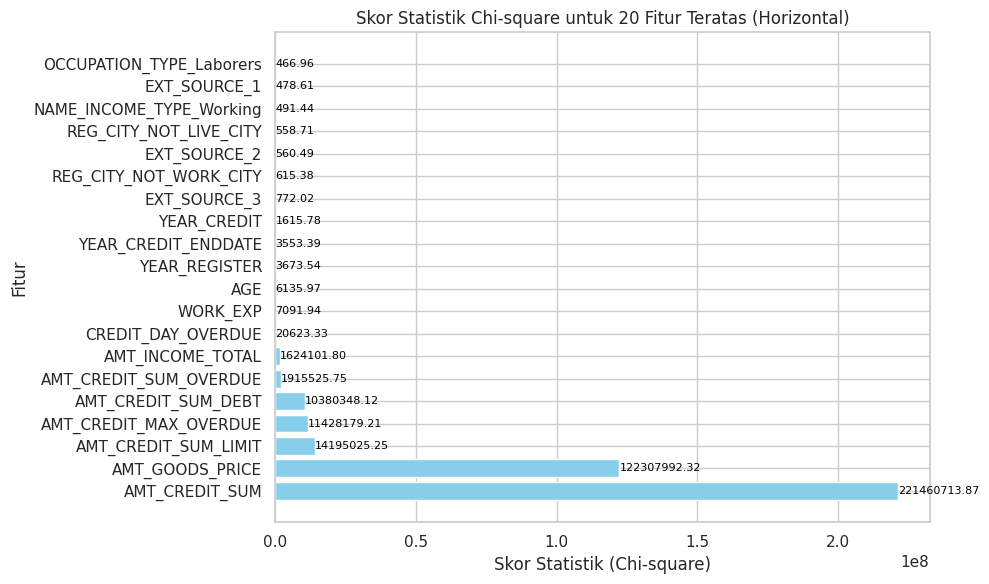

In [ ]:
top_features = feature_score.nlargest(20, 'Score')

# Plot skor statistik secara horizontal
plt.figure(figsize=(10, 6))
bars = plt.barh(top_features['Feature'], top_features['Score'], color='skyblue')

# Anotasi untuk setiap bar
for bar, score in zip(bars, top_features['Score']):
    plt.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height() / 2,
             f'{score:.2f}', ha='left', va='center', color='black', fontsize=8)

plt.xlabel('Skor Statistik (Chi-square)')
plt.ylabel('Fitur')
plt.title('Skor Statistik Chi-square untuk 20 Fitur Teratas (Horizontal)')
plt.tight_layout()
plt.show()

####**Feature Importance - XGB**

                                 Feature  Importance
50                          EXT_SOURCE_3    0.039518
33                          EXT_SOURCE_2    0.034584
40                 CREDIT_TYPE_Microloan    0.026955
46                  CREDIT_TYPE_Mortgage    0.016880
93                          EXT_SOURCE_1    0.015874
67              OCCUPATION_TYPE_Laborers    0.015543
32              NAME_INCOME_TYPE_Working    0.015032
106         ORGANIZATION_TYPE_Restaurant    0.013522
20    OCCUPATION_TYPE_Low-skill Laborers    0.013168
1                        AMT_GOODS_PRICE    0.013045
41            OCCUPATION_TYPE_Core staff    0.012713
79               OCCUPATION_TYPE_Drivers    0.012711
125                             WORK_EXP    0.012178
24                REG_CITY_NOT_LIVE_CITY    0.011962
73        NAME_INCOME_TYPE_State servant    0.011885
78   ORGANIZATION_TYPE_Transport: type 3    0.011826
6            REGION_RATING_CLIENT_W_CITY    0.011689
95                        FLAG_EMP_PHONE    0.

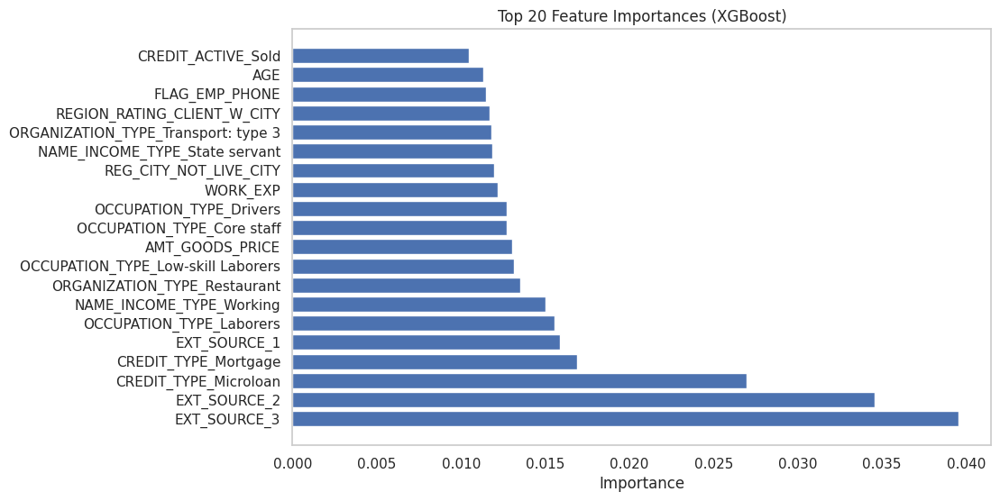

In [ ]:
import xgboost as xgb

# Inisialisasi model XGBoost Classifier
model = xgb.XGBClassifier()

# Melakukan pelatihan model
model.fit(x_train1, y_train1)

# Dapatkan fitur importance
feature_importances_xgb = model.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df_xgb = pd.DataFrame({'Feature': x_train.columns, 'Importance': feature_importances_xgb})

# Sort features by importance in descending order
feature_importance_df_xgb = feature_importance_df_xgb.sort_values(by='Importance', ascending=False)

# Display the top N features
num_features_to_display = 20
top_features_xgb = feature_importance_df_xgb.head(num_features_to_display)
print(top_features_xgb)

# Plot horizontal bar chart
plt.figure(figsize=(10, 6))
plt.barh(top_features_xgb['Feature'], top_features_xgb['Importance'])
plt.xlabel('Importance')
plt.title('Top {} Feature Importances (XGBoost)'.format(num_features_to_display))
plt.grid(False)
plt.show()

In [ ]:
top_features_xgb

,Feature,Importance
50,EXT_SOURCE_3,0.039518
33,EXT_SOURCE_2,0.034584
40,CREDIT_TYPE_Microloan,0.026955
46,CREDIT_TYPE_Mortgage,0.016880
93,EXT_SOURCE_1,0.015874
67,OCCUPATION_TYPE_Laborers,0.015543
32,NAME_INCOME_TYPE_Working,0.015032
106,ORGANIZATION_TYPE_Restaurant,0.013522
20,OCCUPATION_TYPE_Low-skill Laborers,0.013168
1,AMT_GOODS_PRICE,0.013045


####**Feature Importance - RandomForest**

                                      Feature  Importance
33                               EXT_SOURCE_2    0.091480
50                               EXT_SOURCE_3    0.067067
1                             AMT_GOODS_PRICE    0.057282
77                                        AGE    0.056437
114                REGION_POPULATION_RELATIVE    0.056047
26                              YEAR_REGISTER    0.055894
104                          AMT_INCOME_TOTAL    0.054684
42                             AMT_CREDIT_SUM    0.054389
93                               EXT_SOURCE_1    0.040817
125                                  WORK_EXP    0.038574
19                        AMT_CREDIT_SUM_DEBT    0.031897
7                         YEAR_CREDIT_ENDDATE    0.029581
2                                 YEAR_CREDIT    0.025855
96                            CNT_FAM_MEMBERS    0.025775
10                          YEAR_ENDDATE_FACT    0.025604
92                     AMT_CREDIT_MAX_OVERDUE    0.016588
6             

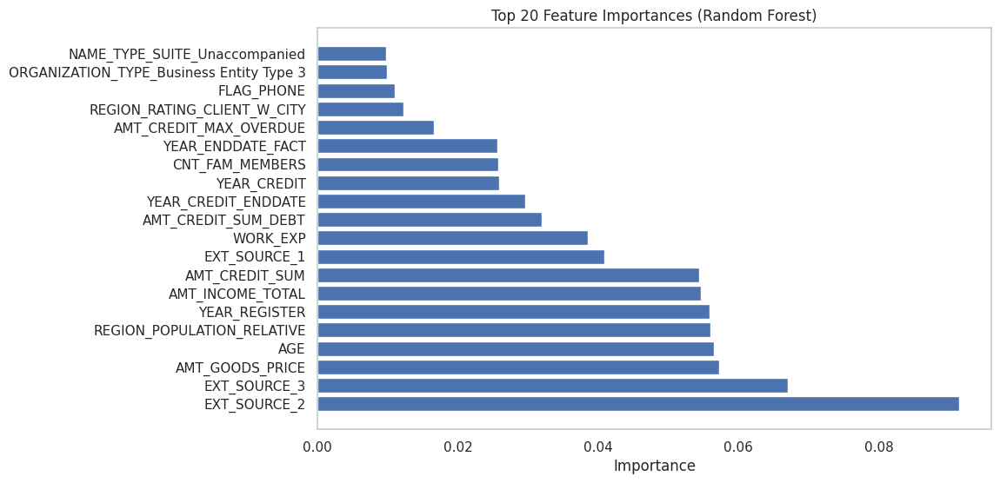

In [ ]:
model_rf = RandomForestClassifier()
model_rf.fit(x_train1, y_train1)

feature_importances_rf = model_rf.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df_rf = pd.DataFrame({'Feature': x_train.columns, 'Importance': feature_importances_rf})

# Sort features by importance in descending order
feature_importance_df_rf = feature_importance_df_rf.sort_values(by='Importance', ascending=False)

# Display the top N features
num_features_to_display = 20
top_features_rf = feature_importance_df_rf.head(num_features_to_display)
print(top_features_rf)

# Plot horizontal bar chart
plt.figure(figsize=(10, 6))
plt.barh(top_features_rf['Feature'], top_features_rf['Importance'])
plt.xlabel('Importance')
plt.title('Top {} Feature Importances (Random Forest)'.format(num_features_to_display))
plt.grid(False)
plt.show()

##**Best Feat**

In [ ]:
best_feat =  top_features_rf.head(20)
best_col = best_feat['Feature']

In [ ]:
best_col

33                                 EXT_SOURCE_2
50                                 EXT_SOURCE_3
1                               AMT_GOODS_PRICE
77                                          AGE
114                  REGION_POPULATION_RELATIVE
26                                YEAR_REGISTER
104                            AMT_INCOME_TOTAL
42                               AMT_CREDIT_SUM
93                                 EXT_SOURCE_1
125                                    WORK_EXP
19                          AMT_CREDIT_SUM_DEBT
7                           YEAR_CREDIT_ENDDATE
2                                   YEAR_CREDIT
96                              CNT_FAM_MEMBERS
10                            YEAR_ENDDATE_FACT
92                       AMT_CREDIT_MAX_OVERDUE
6                   REGION_RATING_CLIENT_W_CITY
80                                   FLAG_PHONE
89     ORGANIZATION_TYPE_Business Entity Type 3
88                NAME_TYPE_SUITE_Unaccompanied
Name: Feature, dtype: object

In [ ]:
x2 = df_model1[best_col]
y2 = df_model1['TARGET']

In [ ]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(x2, y2,test_size = 0.3,random_state = 42)

##**Correlation Feature**

<ipython-input-197-337b7ad28d75>:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_model1[best_col].corr(), dtype=np.bool))


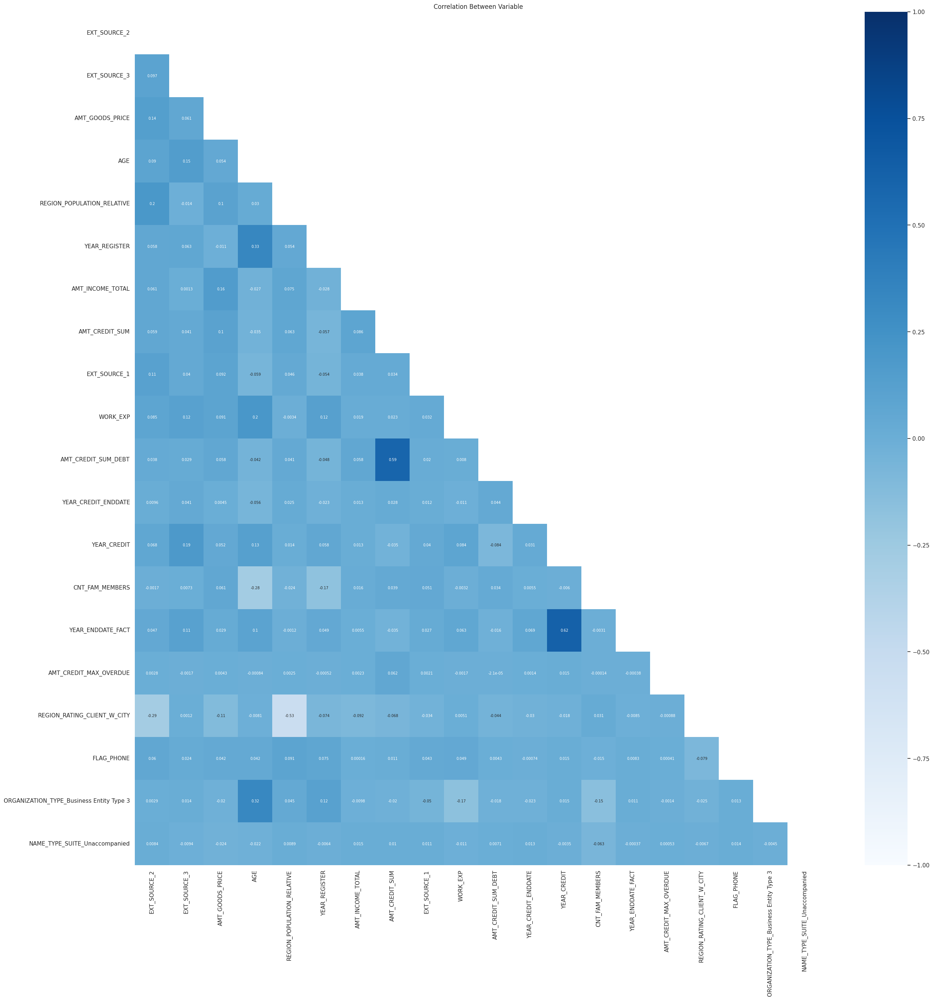

In [ ]:
fig = plt.figure(figsize=(30,30))

ax = fig.add_subplot(1, 1, 1)
ax.set_title('Correlation Between Variable')

mask = np.triu(np.ones_like(
    df_model1[best_col].corr(), dtype=np.bool))

sns.heatmap(df_model1[best_col].corr()
            ,vmin=-1
            ,vmax=1
            ,cmap='Blues'
            ,annot=True
            ,mask=mask
            ,annot_kws={"fontsize":7})
plt.grid(False)

plt.show()

#**Without Sampling**

##**ModelDef**

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

model_df = {}

def model_val(model, x, y):
    model.fit(x_train2, y_train2)
    y_pred = model.predict(x_test2)

    # Menampilkan accuracy score
    accuracy = accuracy_score(y_test2, y_pred)
    print(f"{model} accuracy is {accuracy}")

    # Menampilkan ROC AUC score
    roc_auc = roc_auc_score(y_test2, y_pred)
    print(f"{model} ROC AUC score is {roc_auc}")

    # Menampilkan ROC curve
    fpr, tpr, thresholds = roc_curve(y_test2, y_pred)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model} ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

    # Menampilkan confusion matrix
    cm = confusion_matrix(y_test2, y_pred)

    # Menampilkan confusion matrix dengan ConfusionMatrixDisplay
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Risk', 'Risk'])
    disp.plot(cmap='Blues', values_format='d')

    plt.title('Confusion Matrix')
    plt.grid(False)
    plt.show()

    # Menampilkan classification report
    class_report = classification_report(y_test2, y_pred)
    print(f"Classification Report:\n{class_report}")

    # Menambahkan ke dictionary model_df
    model_df[model] = {'accuracy': round(accuracy * 100, 2), 'ROC AUC': round(roc_auc, 2)}


##**LogReg**

LogisticRegression(class_weight='balanced', max_iter=75) accuracy is 0.6579660502525636
LogisticRegression(class_weight='balanced', max_iter=75) ROC AUC score is 0.6524566717418715


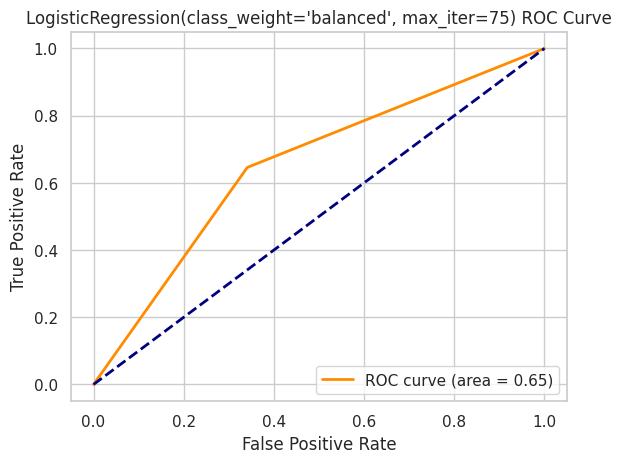

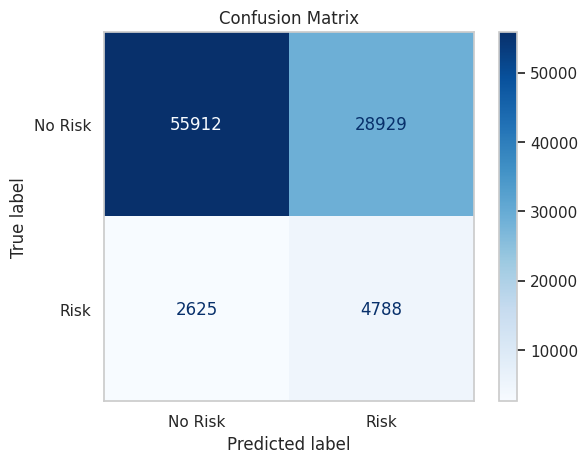

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.66      0.78     84841
           1       0.14      0.65      0.23      7413

    accuracy                           0.66     92254
   macro avg       0.55      0.65      0.51     92254
weighted avg       0.89      0.66      0.74     92254



In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(class_weight='balanced',max_iter=75)
model_val(model,x,y)

##**XGBoost**

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) accuracy is 0.9192663732737876
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
           

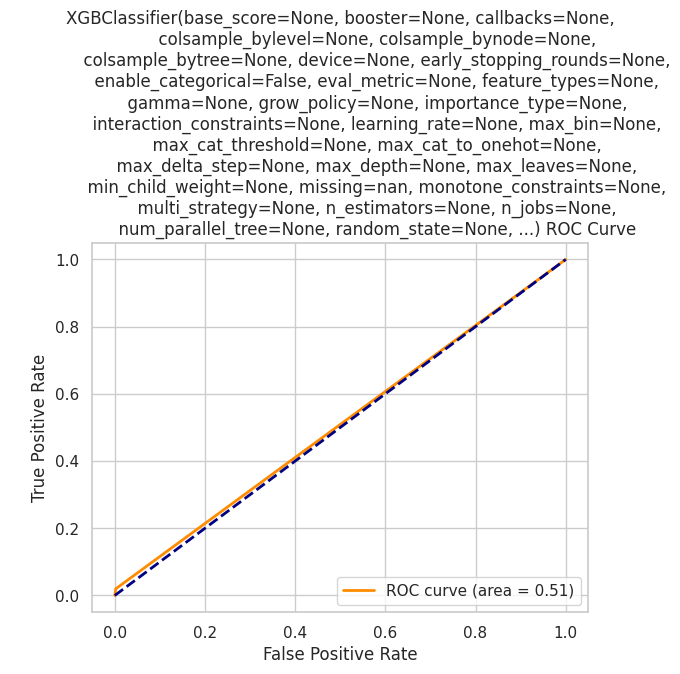

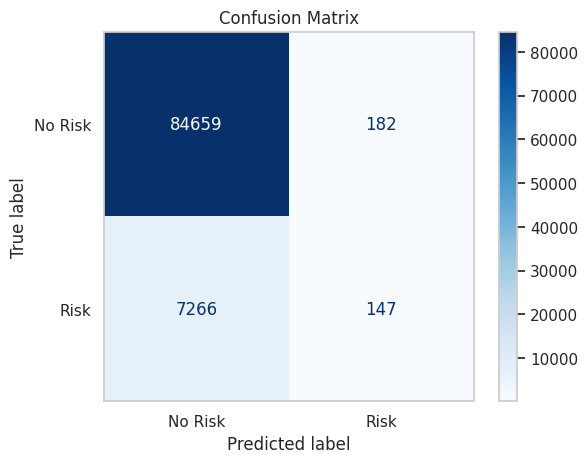

Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     84841
           1       0.45      0.02      0.04      7413

    accuracy                           0.92     92254
   macro avg       0.68      0.51      0.50     92254
weighted avg       0.88      0.92      0.88     92254



In [ ]:
from xgboost import XGBClassifier
model = XGBClassifier()
model_val(model,x,y)

##**RF**

RandomForestClassifier() accuracy is 0.9198083551932708
RandomForestClassifier() ROC AUC score is 0.5026121843112586


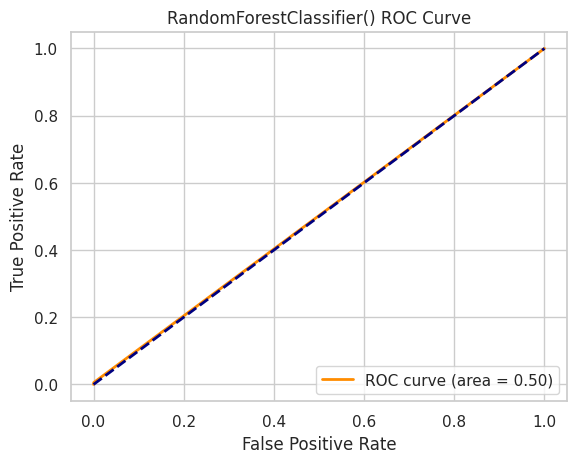

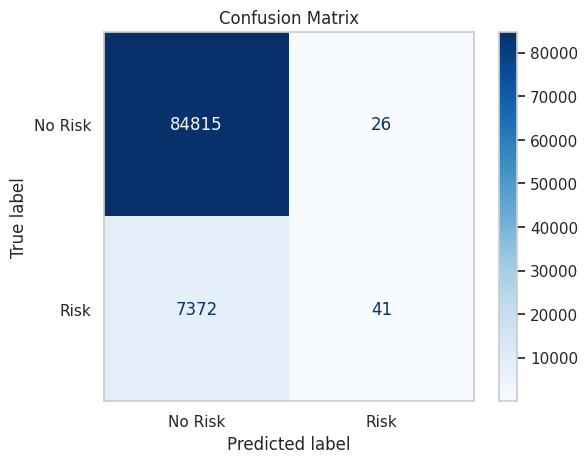

Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     84841
           1       0.61      0.01      0.01      7413

    accuracy                           0.92     92254
   macro avg       0.77      0.50      0.48     92254
weighted avg       0.90      0.92      0.88     92254



In [ ]:
model = RandomForestClassifier()
model_val(model,x,y)

#**Under Sampling**

In [ ]:
# x2 = df_model2[best_col]
# y2 = df_model2['TARGET']

Distribusi kelas setelah undersampling: Counter({0: 17412, 1: 17412})


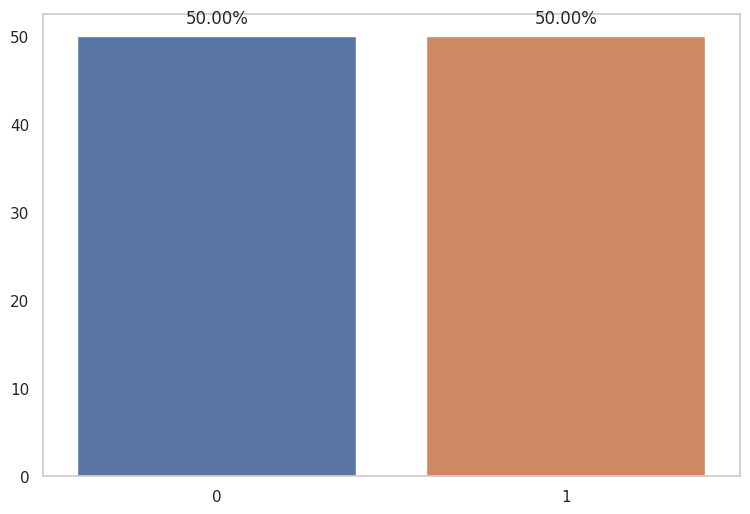

In [ ]:
from collections import Counter

undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)
x_train2, y_train2 = undersampler.fit_resample(x_train2, y_train2)

print("Distribusi kelas setelah undersampling:", Counter(y_train2))
fig, ax = plt.subplots(figsize=(9, 6))

percentage_per_class = y_train2.value_counts(normalize=True) * 100

sns.barplot(x=percentage_per_class.index, y=percentage_per_class.values, ax=ax)


for i, percentage in enumerate(percentage_per_class.values):
    ax.text(i, percentage + 1, f'{percentage:.2f}%', ha='center', va='bottom')

plt.grid(False)
plt.show()


The data has been resampled and minority class has been balanced

###**Model Def**

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

model2_df = {}

def model2_val(model, x, y):
    model.fit(x_train2, y_train2)
    y_pred = model.predict(x_test2)

    # Menampilkan accuracy score
    accuracy = accuracy_score(y_test2, y_pred)
    print(f"{model} accuracy is {accuracy}")

    # Menampilkan ROC AUC score
    roc_auc = roc_auc_score(y_test2, y_pred)
    print(f"{model} ROC AUC score is {roc_auc}")

    # Menampilkan ROC curve
    fpr, tpr, thresholds = roc_curve(y_test2, y_pred)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model} ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

    # Menampilkan confusion matrix
    cm = confusion_matrix(y_test2, y_pred)

    # Menampilkan confusion matrix dengan ConfusionMatrixDisplay
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Risk', 'Risk'])
    disp.plot(cmap='Blues', values_format='d')

    plt.title('Confusion Matrix')
    plt.grid(False)
    plt.show()

    # Menampilkan classification report
    class_report = classification_report(y_test2, y_pred)
    print(f"Classification Report:\n{class_report}")

    # Menambahkan ke dictionary model2_df
    model2_df[model] = {'accuracy': round(accuracy * 100, 2), 'ROC AUC': round(roc_auc, 2)}


###**LogReg**

LogisticRegression() accuracy is 0.6558198018514102
LogisticRegression() ROC AUC score is 0.6535057882526283


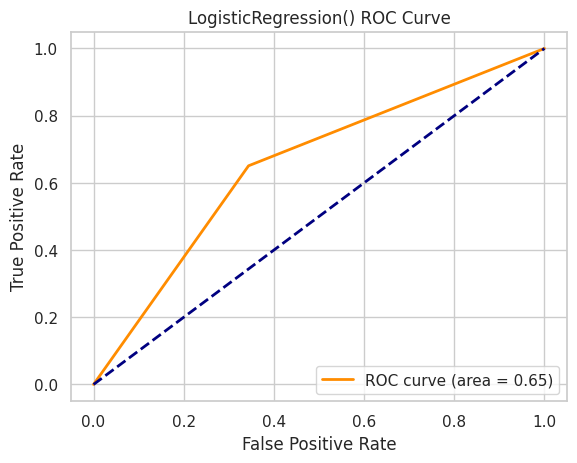

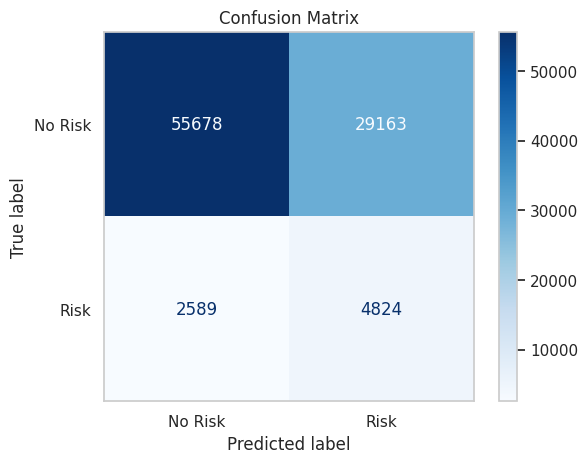

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.66      0.78     84841
           1       0.14      0.65      0.23      7413

    accuracy                           0.66     92254
   macro avg       0.55      0.65      0.51     92254
weighted avg       0.89      0.66      0.73     92254



In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model2_val(model,x,y)

###**XGB**

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) accuracy is 0.6692501138162031
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
           

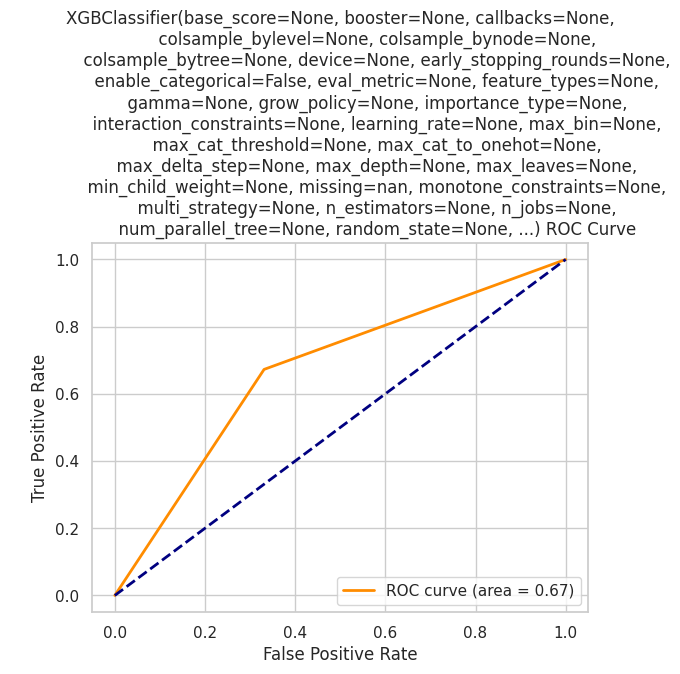

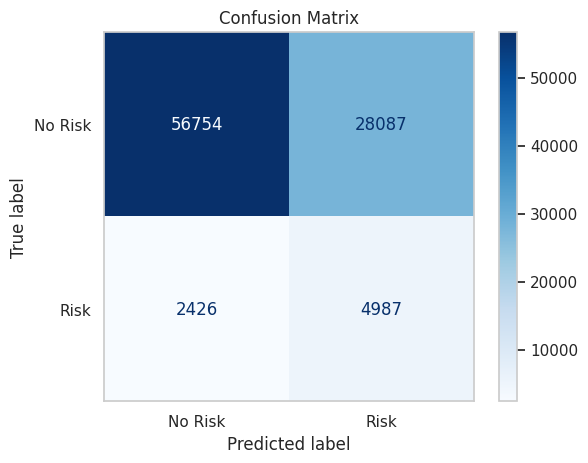

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.67      0.79     84841
           1       0.15      0.67      0.25      7413

    accuracy                           0.67     92254
   macro avg       0.55      0.67      0.52     92254
weighted avg       0.89      0.67      0.74     92254



In [ ]:
from xgboost import XGBClassifier
model = XGBClassifier()
model2_val(model,x,y)

###**RF**

RandomForestClassifier() accuracy is 0.6802089882281527
RandomForestClassifier() ROC AUC score is 0.6692281145111475


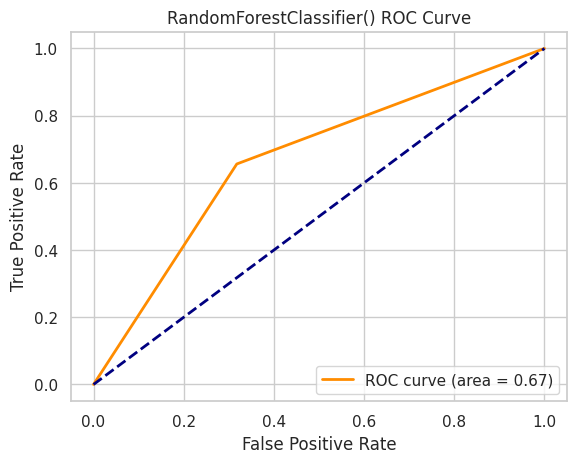

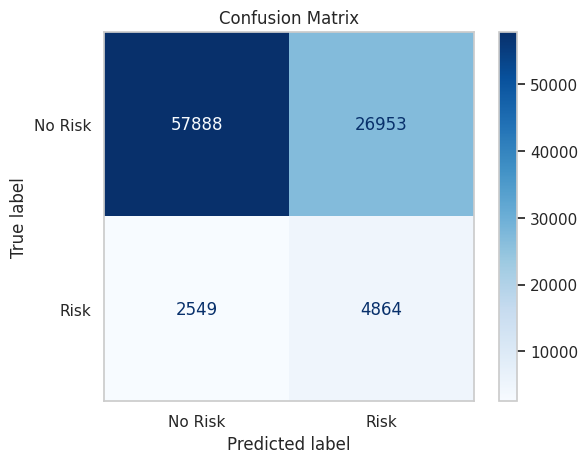

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.68      0.80     84841
           1       0.15      0.66      0.25      7413

    accuracy                           0.68     92254
   macro avg       0.56      0.67      0.52     92254
weighted avg       0.89      0.68      0.75     92254



In [ ]:
model = RandomForestClassifier()
model2_val(model,x,y)

###**Hyper Parameter**

In [ ]:
# from sklearn.model_selection import GridSearchCV
# from scipy.stats import randint, uniform
# from sklearn.datasets import make_classification

# # RandomForestClassifier
# rf_grid={'n_estimators':[10,20],
#   'max_features':['sqrt'],
#  'max_depth':[5,35],
#  'min_samples_split':[2,5,],
#  'min_samples_leaf':[2,5]
#  }

# rf_model = GridSearchCV(RandomForestClassifier(),
#                   param_grid=rf_grid,
#                    cv=5,
#                    n_jobs=-1,
#                    scoring='recall',
#                   verbose=True)

# rf_model.fit(x1,y1)

# print("Random Forest - Best Parameters:", rf_model.best_params_)
# print("Random Forest - Best Accuracy:", rf_model.best_score_)

#Fitting 5 folds for each of 16 candidates, totalling 80 fits
#Random Forest - Best Parameters: {'max_depth': 35, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 10}
#Random Forest - Best Accuracy: 0.018811681772406847

RandomForestClassifier(max_depth=100, min_samples_leaf=5, min_samples_split=4,
                       random_state=42) accuracy is 0.6746157348190864
RandomForestClassifier(max_depth=100, min_samples_leaf=5, min_samples_split=4,
                       random_state=42) ROC AUC score is 0.6714193663759346


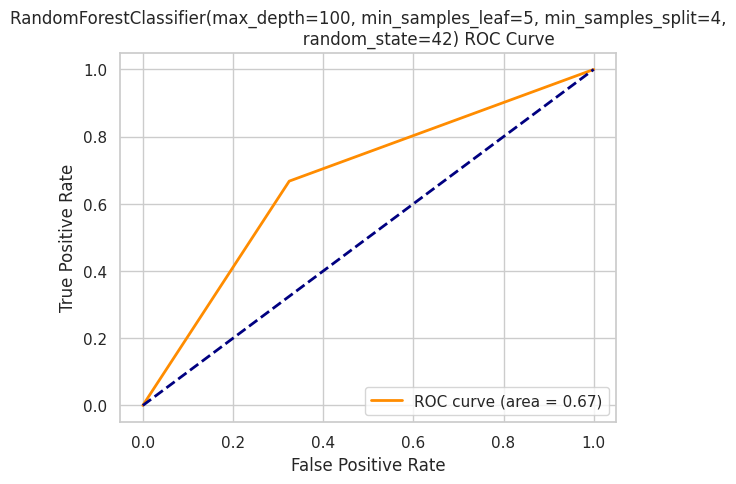

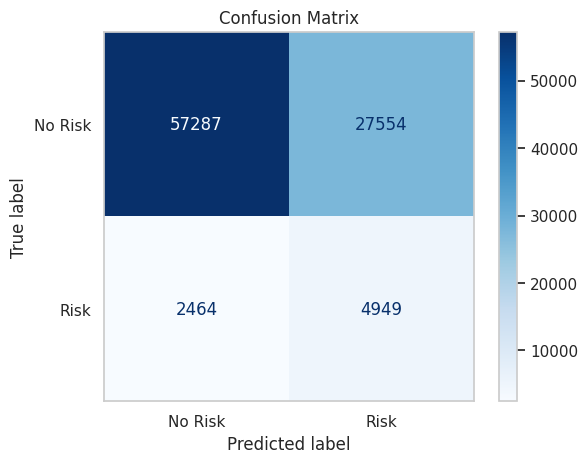

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.68      0.79     84841
           1       0.15      0.67      0.25      7413

    accuracy                           0.67     92254
   macro avg       0.56      0.67      0.52     92254
weighted avg       0.89      0.67      0.75     92254



In [ ]:
best_par = {'max_depth': 100, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 4, 'n_estimators': 100}
model = RandomForestClassifier(**best_par, random_state=42)
model2_val(model, x,y)

###**GBC**

GradientBoostingClassifier() accuracy is 0.6733149782123269
GradientBoostingClassifier() ROC AUC score is 0.6769292867245869


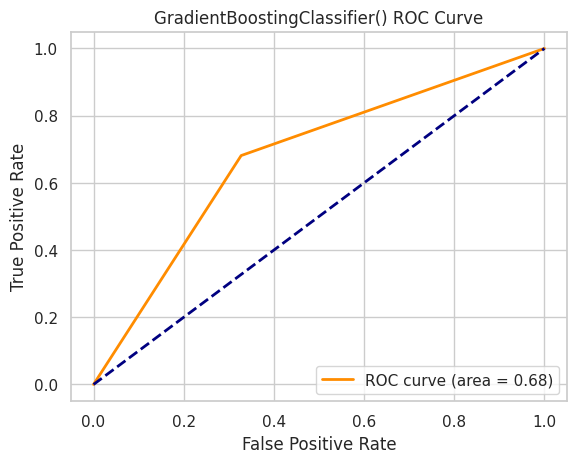

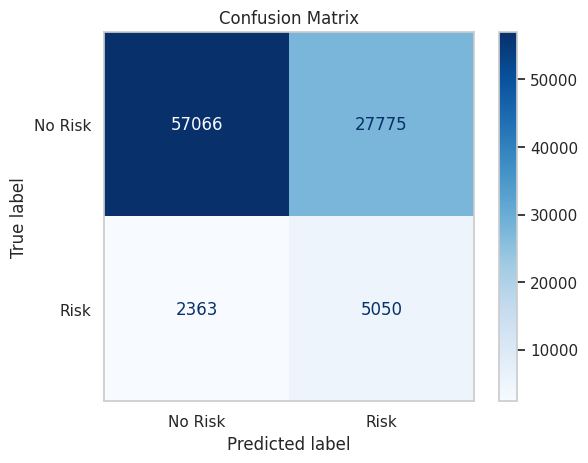

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.67      0.79     84841
           1       0.15      0.68      0.25      7413

    accuracy                           0.67     92254
   macro avg       0.56      0.68      0.52     92254
weighted avg       0.90      0.67      0.75     92254



In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
model=GradientBoostingClassifier()
model2_val(model,x,y)

##**Hyper Parameter**

In [ ]:
# Tentukan parameter grid yang akan diuji
# param_grid = {
#     'n_estimators': [50, 100],
#     'learning_rate': [0.01, 0.1],
#     'max_depth': [3, 5]
# }

# gb_model = GradientBoostingClassifier()

# grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, scoring='recall', cv=5,verbose=True)

# grid_search.fit(x_train2, y_train2)


# print("Best parameters found: ", grid_search.best_params_)
# print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))


# best_model = grid_search.best_estimator_
# recall_on_test = best_model.score(x_test2, y_test2)
# print("recall on test set: {:.2f}".format(recall_on_test))

# # Fitting 5 folds for each of 8 candidates, totalling 40 fits
# # Best parameters found:  {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}
# # Best cross-validation score: 0.69
# # recall on test set: 0.63

GradientBoostingClassifier(learning_rate=0.01) accuracy is 0.6325362585904134
GradientBoostingClassifier(learning_rate=0.01) ROC AUC score is 0.658267077203142


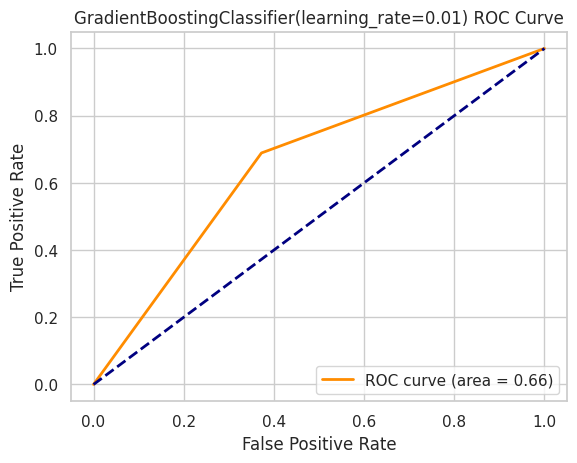

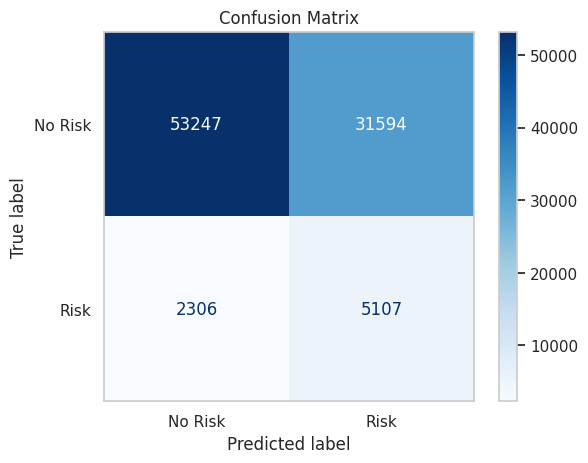

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.63      0.76     84841
           1       0.14      0.69      0.23      7413

    accuracy                           0.63     92254
   macro avg       0.55      0.66      0.50     92254
weighted avg       0.89      0.63      0.72     92254



In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier

param_set = {
    'n_estimators': 100,
    'learning_rate': 0.01,
    'max_depth': 3
}

model = GradientBoostingClassifier(**param_set)
model2_val(model,x,y)

#**Model Select**

After trying and error, and looking at overall result, we will use undersampled parameter-tuned GradientBoostingClassifier model based on ROC and recall score and confusion matrix, because it reducing number of FN

In [ ]:
# scaler = StandardScaler()
# df_model1[best_col] = scaler.fit_transform(df_model1[best_col])
# x2 = df_model1[best_col]
# y2 = df_model1['TARGET']

In [ ]:
# x_train2, x_test2, y_train2, y_test2 = train_test_split(x2, y2,test_size = 0.3,random_state = 42)

In [ ]:
param_set = {
    'n_estimators': 100,
    'learning_rate': 0.01,
    'max_depth': 3
}
model_sel = GradientBoostingClassifier(**param_set, random_state=42)
model_sel.fit(x_train2,y_train2)

GradientBoostingClassifier(learning_rate=0.01, random_state=42)

#**Re-predict training dataset**

In [ ]:
x_tp = df_model[best_col]
x_tp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 20 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   EXT_SOURCE_2                              307511 non-null  float64
 1   EXT_SOURCE_3                              307511 non-null  float64
 2   AMT_GOODS_PRICE                           307511 non-null  float64
 3   AGE                                       307511 non-null  float64
 4   REGION_POPULATION_RELATIVE                307511 non-null  float64
 5   YEAR_REGISTER                             307511 non-null  float64
 6   AMT_INCOME_TOTAL                          307511 non-null  float64
 7   AMT_CREDIT_SUM                            307511 non-null  float64
 8   EXT_SOURCE_1                              307511 non-null  float64
 9   WORK_EXP                                  307511 non-null  float64
 10  AMT_CREDIT_SUM_DEBT 

In [ ]:
predicted_prob = model_sel.predict_proba(x_tp)
predicted_prob = pd.DataFrame(predicted_prob[:,1], columns = ['RISK_CHANCE'])

In [ ]:
predicted_probs = model_sel.predict(x_tp)
predicted_probs = pd.DataFrame(predicted_probs, columns = ['TARGET'])
# predicted_probs

In [ ]:
prob_target = pd.concat([predicted_prob,predicted_probs],axis=1)

In [ ]:
prob_target.groupby('TARGET')['RISK_CHANCE'].max()

TARGET
0    0.499961
1    0.525691
Name: RISK_CHANCE, dtype: float64

In [ ]:
prob_target.groupby('TARGET')['RISK_CHANCE'].min()

TARGET
0    0.337550
1    0.500236
Name: RISK_CHANCE, dtype: float64

those who scored more than 60% will be considered default

In [ ]:
y=y.reset_index()
y = y.drop('index', axis=1)
y

,TARGET
0,1
1,0
2,0
3,0
4,0
...,...
307506,0
307507,0
307508,0
307509,1


In [ ]:
df_tp = df_model.copy().reset_index()
df_tp.drop('index',axis=1,inplace=True)

In [ ]:
x_tp = df_tp[best_col]

In [ ]:
df_tp['SK_ID_CURR'] = df_model['SK_ID_CURR']
df_tp['DEFAULT_CHANCE']= model_sel.predict_proba(x_tp)[:,1]
df_tp['TARGET'] = y['TARGET']

In [ ]:
def threshold_category(df_tp):

    if (df_tp['DEFAULT_CHANCE'] <= 0.45 ):
        return 'N'
    else:
        return 'Y'

df_tp['DEFAULT?'] = df_tp.apply(threshold_category, axis = 1)

In [ ]:
df_tp.groupby('TARGET')['SK_ID_CURR'].count()

TARGET
0    282686
1     24825
Name: SK_ID_CURR, dtype: int64

In [ ]:
df_tp.groupby('DEFAULT?')['SK_ID_CURR'].count()

DEFAULT?
N    215546
Y     91965
Name: SK_ID_CURR, dtype: int64

there is **increase of 270% of defaulted customer** in training data

#**Test Data**

In [ ]:
best_col

33                                 EXT_SOURCE_2
50                                 EXT_SOURCE_3
1                               AMT_GOODS_PRICE
77                                          AGE
114                  REGION_POPULATION_RELATIVE
26                                YEAR_REGISTER
104                            AMT_INCOME_TOTAL
42                               AMT_CREDIT_SUM
93                                 EXT_SOURCE_1
125                                    WORK_EXP
19                          AMT_CREDIT_SUM_DEBT
7                           YEAR_CREDIT_ENDDATE
2                                   YEAR_CREDIT
96                              CNT_FAM_MEMBERS
10                            YEAR_ENDDATE_FACT
92                       AMT_CREDIT_MAX_OVERDUE
6                   REGION_RATING_CLIENT_W_CITY
80                                   FLAG_PHONE
89     ORGANIZATION_TYPE_Business Entity Type 3
88                NAME_TYPE_SUITE_Unaccompanied
Name: Feature, dtype: object

In [ ]:
df_testf = df_new1.copy()

In [ ]:
df_testf[best_col].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48744 entries, 0 to 48743
Data columns (total 20 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   EXT_SOURCE_2                              48744 non-null  float64
 1   EXT_SOURCE_3                              48744 non-null  float64
 2   AMT_GOODS_PRICE                           48744 non-null  float64
 3   AGE                                       48744 non-null  float64
 4   REGION_POPULATION_RELATIVE                48744 non-null  float64
 5   YEAR_REGISTER                             48744 non-null  float64
 6   AMT_INCOME_TOTAL                          48744 non-null  float64
 7   AMT_CREDIT_SUM                            48744 non-null  float64
 8   EXT_SOURCE_1                              48744 non-null  float64
 9   WORK_EXP                                  48744 non-null  float64
 10  AMT_CREDIT_SUM_DEBT               

In [ ]:
# scaler = StandardScaler()
df_testf[best_col]
x3 = df_testf[best_col]

In [ ]:
df_testf['DEFAULT_SCORE'] = model_sel.predict_proba(x3)[:,1]

#**FINAL DATA**

In [ ]:
df_tf = df_test3.copy()

In [ ]:
df_tf = pd.merge(df_tf, df_testf[['SK_ID_CURR', 'DEFAULT_SCORE']], how='left', on='SK_ID_CURR')

In [ ]:
def threshold_category(df_tf):

    if (df_tf['DEFAULT_SCORE'] <= 0.35 ):
        return 'NO'
    elif (df_tf['DEFAULT_SCORE'] > 0.35) and (df_tf['DEFAULT_SCORE'] <= 0.40):
        return 'LOW'
    elif (df_tf['DEFAULT_SCORE'] > 40) and (df_tf['DEFAULT_SCORE'] < 50.):
        return 'MED'
    else:
        return 'YES'

df_tf['DEFAULT_RISK'] = df_tf.apply(threshold_category, axis = 1)

In [ ]:
df_tf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48744 entries, 0 to 48743
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   48744 non-null  int64  
 1   NAME_CONTRACT_TYPE           48744 non-null  object 
 2   CODE_GENDER                  48744 non-null  int64  
 3   FLAG_OWN_CAR                 48744 non-null  int64  
 4   FLAG_OWN_REALTY              48744 non-null  int64  
 5   CNT_CHILDREN                 48744 non-null  int64  
 6   AMT_INCOME_TOTAL             48744 non-null  float64
 7   AMT_CREDIT                   48744 non-null  float64
 8   AMT_ANNUITY                  48744 non-null  float64
 9   AMT_GOODS_PRICE              48744 non-null  float64
 10  NAME_TYPE_SUITE              48744 non-null  object 
 11  NAME_INCOME_TYPE             48744 non-null  object 
 12  NAME_EDUCATION_TYPE          48744 non-null  int64  
 13  NAME_FAMILY_STAT

In [ ]:
df_tf.to_csv('/content/drive/My Drive/Project/HCI/home-credit-default-risk/HomeCredit_trained1.csv', index=False)

#**Trained Data**

In [ ]:
df_trained = pd.read_csv('/content/drive/MyDrive/Project/HCI/home-credit-default-risk/HomeCredit_trained1.csv')

In [ ]:
df_trained.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 58 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   48744 non-null  int64  
 1   NAME_CONTRACT_TYPE           48744 non-null  object 
 2   CODE_GENDER                  48744 non-null  int64  
 3   FLAG_OWN_CAR                 48744 non-null  int64  
 4   FLAG_OWN_REALTY              48744 non-null  int64  
 5   CNT_CHILDREN                 48744 non-null  int64  
 6   AMT_INCOME_TOTAL             48744 non-null  float64
 7   AMT_CREDIT                   48744 non-null  float64
 8   AMT_ANNUITY                  48744 non-null  float64
 9   AMT_GOODS_PRICE              48744 non-null  float64
 10  NAME_TYPE_SUITE              48744 non-null  object 
 11  NAME_INCOME_TYPE             48744 non-null  object 
 12  NAME_EDUCATION_TYPE          48744 non-null  int64  
 13  NAME_FAMILY_STAT

##**Define Status**

In [ ]:
def threshold_category(df_trained):

    if (df_trained['DEFAULT_SCORE'] <= 0.45 ):
        return 'N'
    else:
        return 'Y'

df_trained['DEFAULT?'] = df_trained.apply(threshold_category, axis = 1)

In [ ]:
df_trained.groupby('DEFAULT?')['SK_ID_CURR'].agg(count='count')

,count
DEFAULT?,
N,21430
Y,27314


In [ ]:
df_safe = df_trained[df_trained['DEFAULT?']=="N"].reset_index()
df_def = df_trained[df_trained['DEFAULT?']=="Y"].reset_index()

based on the prediction most of our customer are **Defaulted**

##**EDA**

In [ ]:
df_trained.describe()

,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_EDUCATION_TYPE,...,CREDIT_DAY_OVERDUE,CNT_CREDIT_PROLONG,AGE,WORK_EXP,YEAR_REGISTER,YEAR_CREDIT,YEAR_CREDIT_ENDDATE,YEAR_ENDDATE_FACT,YEAR_CREDIT_UPDATE,DEFAULT_SCORE
count,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48744.000000,4.874400e+04,48744.000000,...,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000
mean,277796.676350,0.670400,0.337129,0.690505,0.397054,1.784318e+05,5.167404e+05,29424.651219,4.626188e+05,1.293821,...,0.343140,0.002605,44.014894,6.443521,13.606782,3.387022,4.657804,2.611993,1.722366,0.470978
std,103169.547296,0.470073,0.472734,0.462290,0.709047,1.015226e+05,3.653970e+05,16012.584824,3.367102e+05,0.457358,...,23.652147,0.057413,11.854680,5.743997,9.732436,2.125110,11.871222,1.790671,1.881236,0.095434
min,100001.000000,0.000000,0.000000,0.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,1.000000,...,0.000000,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.297267
25%,188557.750000,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,1.000000,...,0.000000,0.000000,34.000000,3.000000,5.000000,2.000000,1.000000,2.000000,0.000000,0.384110
50%,277549.000000,1.000000,0.000000,1.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,1.000000,...,0.000000,0.000000,43.000000,5.000000,12.000000,3.000000,2.000000,2.000000,1.000000,0.469596
75%,367555.500000,1.000000,1.000000,1.000000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,2.000000,...,0.000000,0.000000,54.000000,8.000000,20.000000,5.000000,4.000000,3.000000,3.000000,0.541355
max,456250.000000,1.000000,1.000000,1.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,3.000000,...,2534.000000,3.000000,69.000000,48.000000,65.000000,8.000000,85.000000,8.000000,8.000000,0.681925


###**binary and multi values define**

In [ ]:
obj = df_trained.select_dtypes(include=['object'])

In [ ]:
ncol = df_trained.select_dtypes(include=['int64','float64'])

In [ ]:
bcol = []
mcol = []

for n in ncol:
    unique_values = df_trained[n].unique()

    if len(unique_values) == 2:
        bcol.append(n)
    else:
        mcol.append(n)

In [ ]:
bcol = bcol +['NAME_EDUCATION_TYPE']

In [ ]:
mcol = set(mcol) - set(['NAME_EDUCATION_TYPE']) - set(['SK_ID_CURR']) - set(['NAME_EDUCATION_TYPE']) - set(['DEFAULT_SCORE'])
mcol = list(mcol)

##**All**

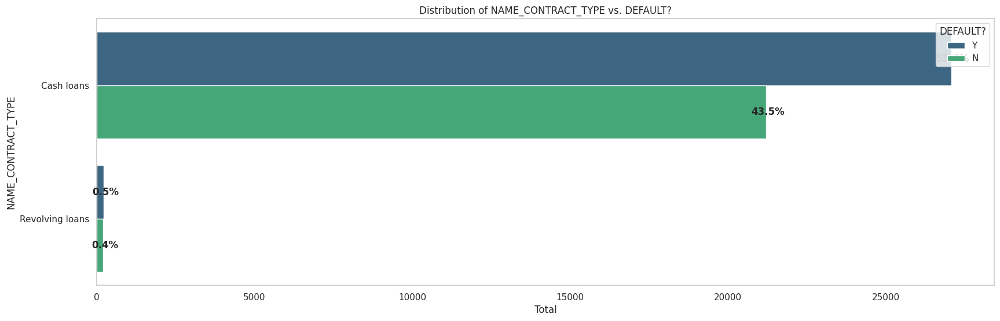

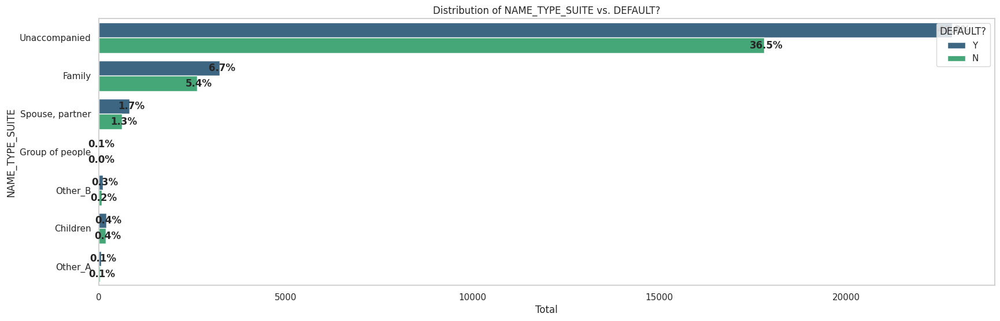

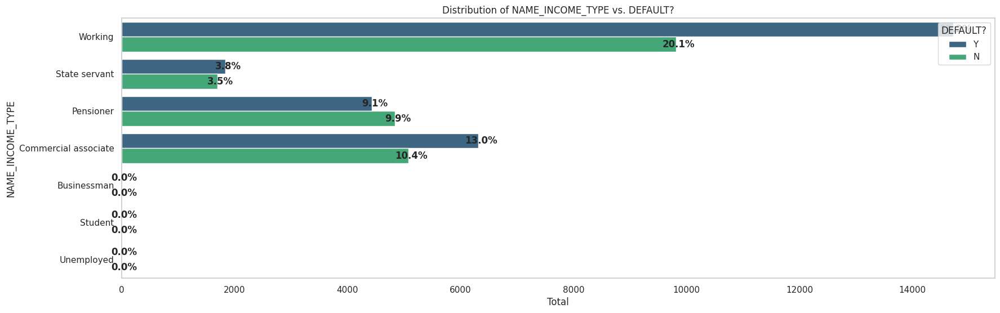

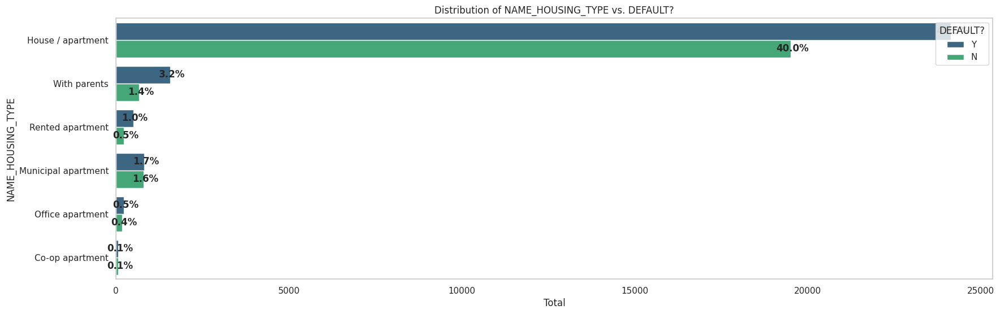

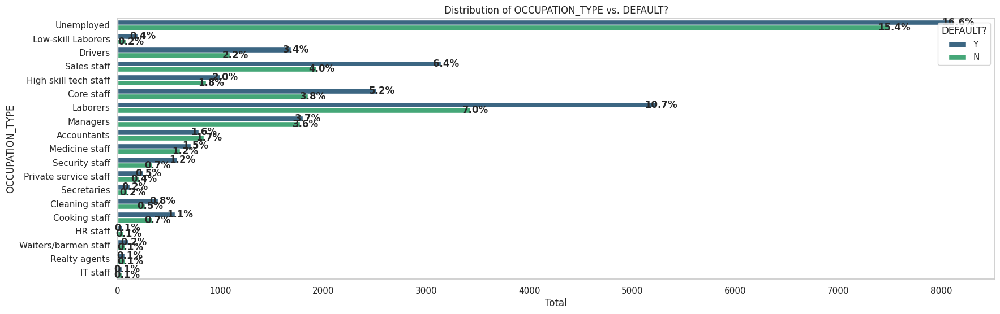

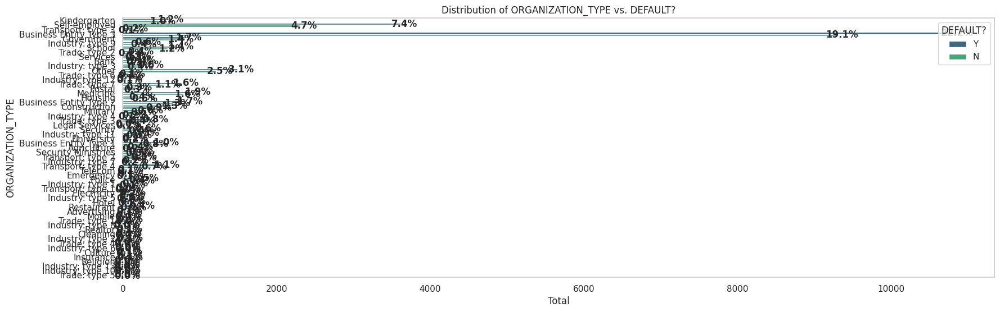

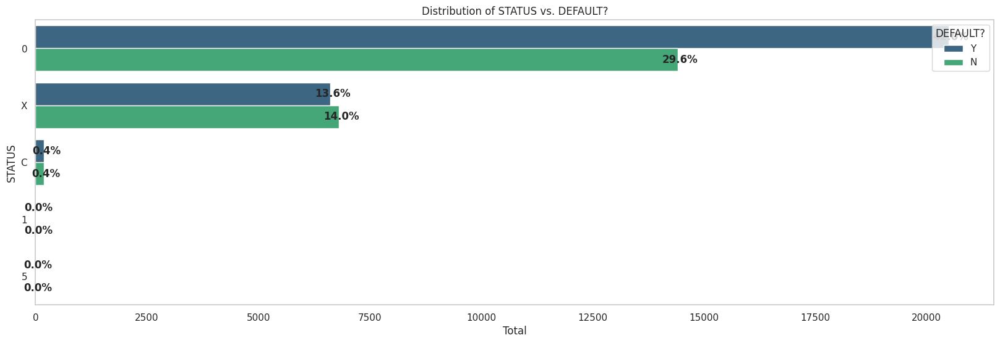

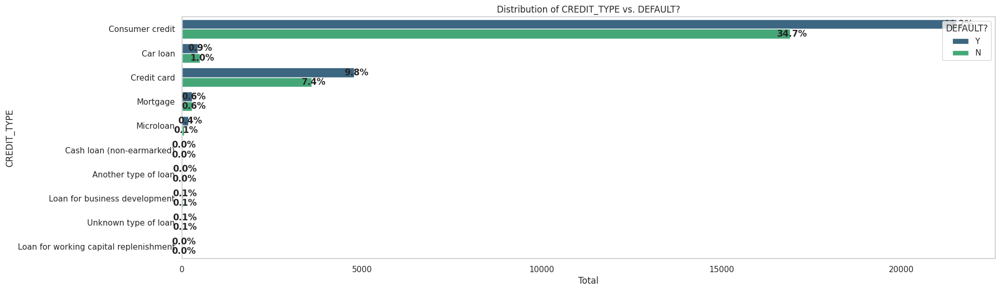

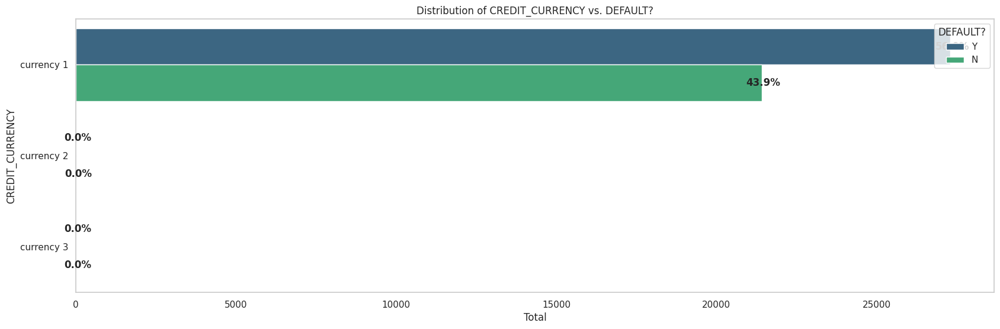

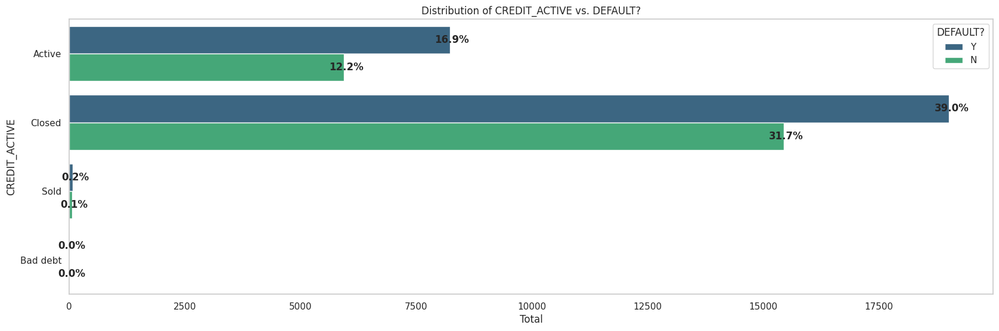

In [ ]:
group_columns = [
    'NAME_CONTRACT_TYPE',
    'NAME_TYPE_SUITE',
    'NAME_INCOME_TYPE',
    'NAME_HOUSING_TYPE',
    'OCCUPATION_TYPE',
    'ORGANIZATION_TYPE',
    'STATUS',
    'CREDIT_TYPE',
    'CREDIT_CURRENCY',
    'CREDIT_ACTIVE'
]

group_columns.append('DEFAULT?')

group_df_trained = df_trained[group_columns]


for col in group_columns[:-1]:
    plt.figure(figsize=(20, 6))
    ax = sns.countplot(y=col, hue='DEFAULT?', data=group_df_trained, palette='viridis')
    plt.title(f'Distribution of {col} vs. DEFAULT?')
    plt.xlabel('Total')  # Label sumbu x
    plt.ylabel(col)  # Label sumbu y
    plt.legend(title='DEFAULT?', loc='upper right')
    plt.grid(False)


    total_data = len(group_df_trained[col])
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width() / total_data)
        ax.annotate(percentage, (p.get_width() + 50, p.get_y() + p.get_height() / 2), ha='center', va='center', weight='bold')

    plt.grid(False)
    plt.show()

##**Safe**

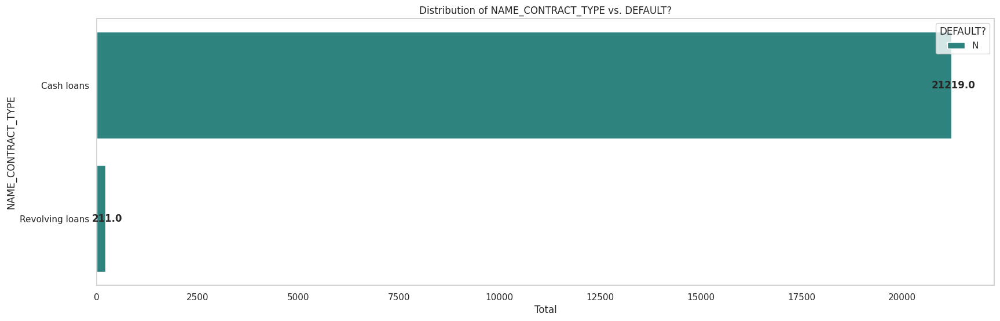

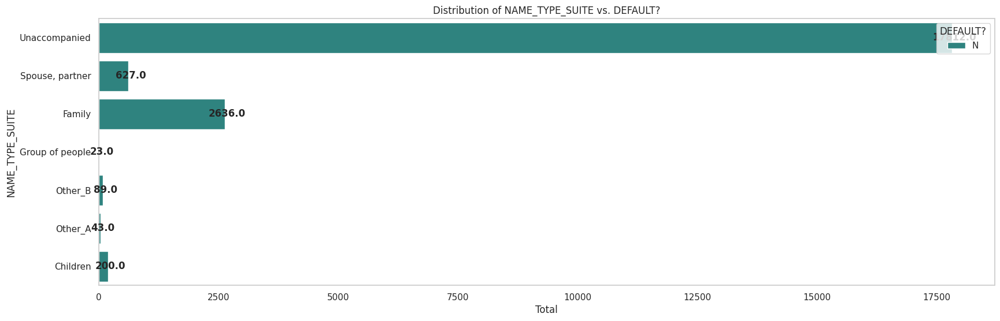

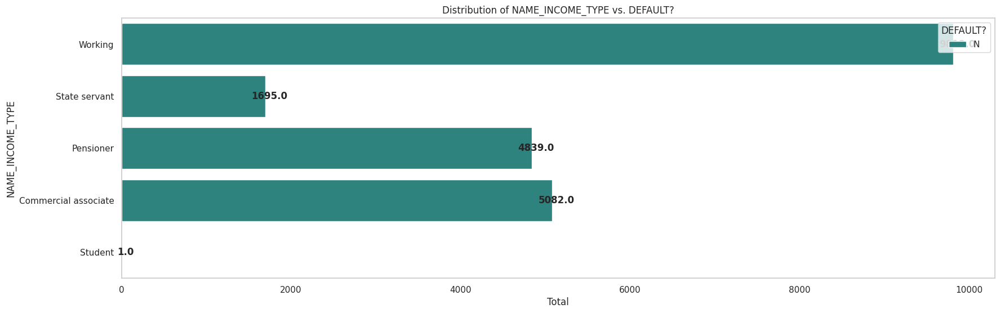

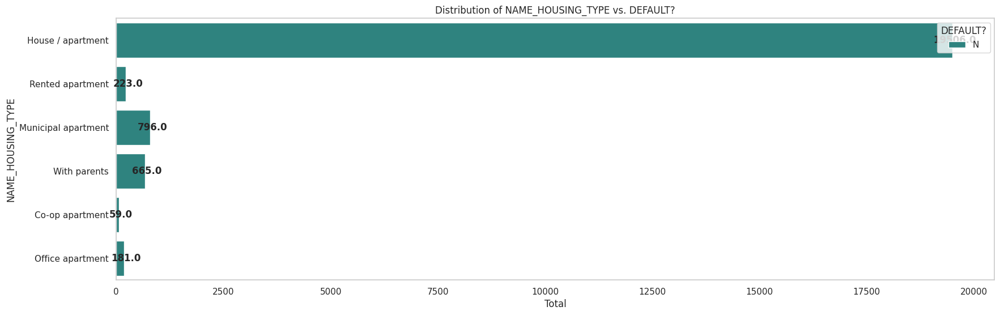

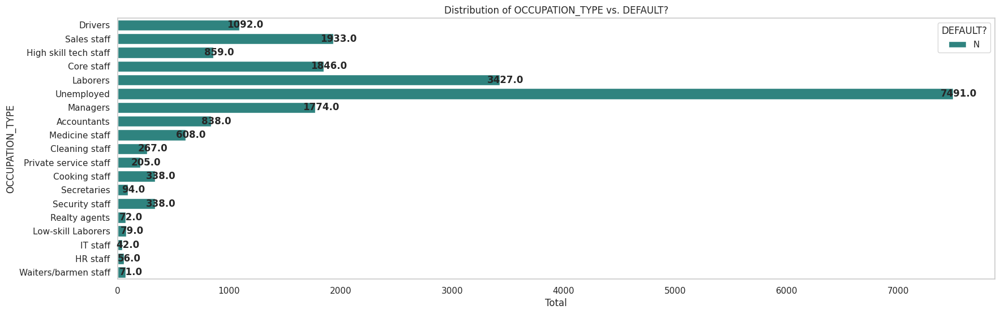

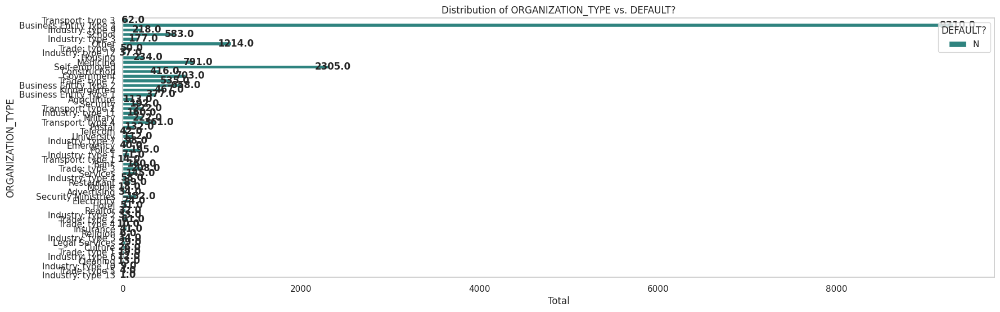

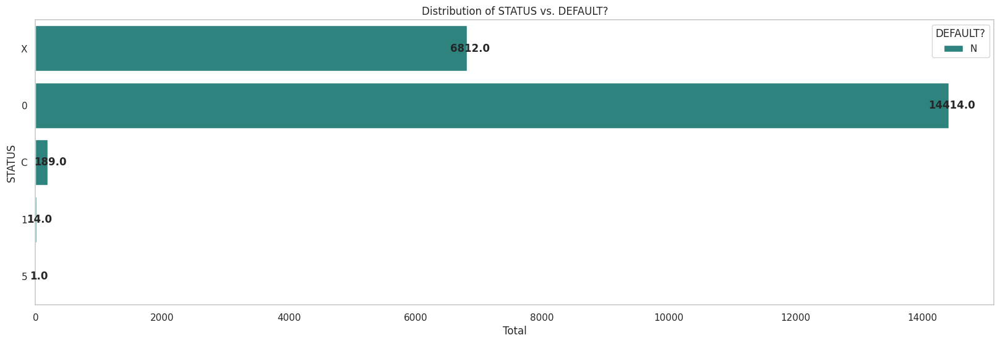

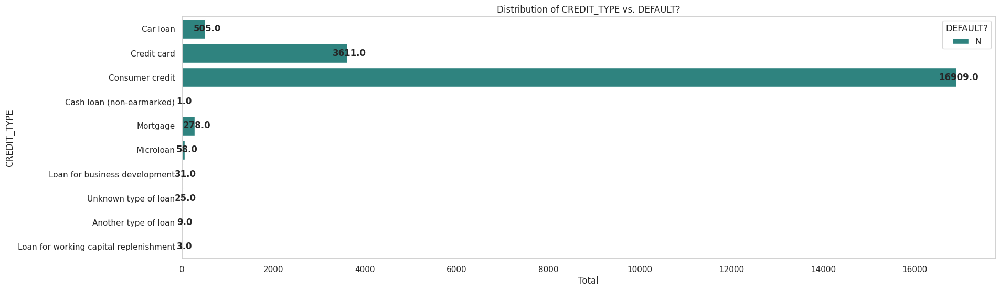

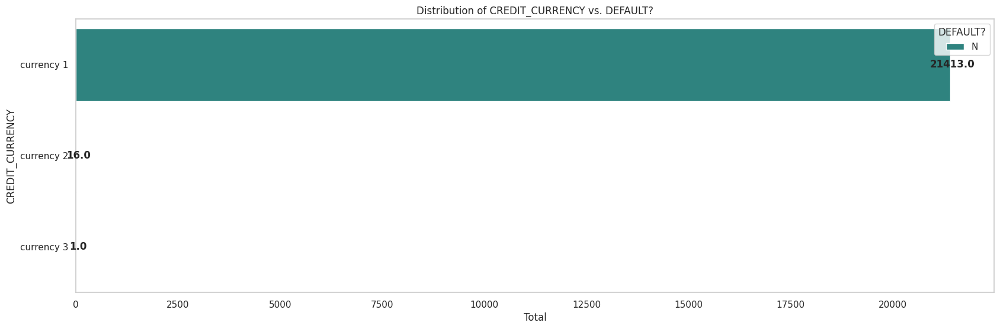

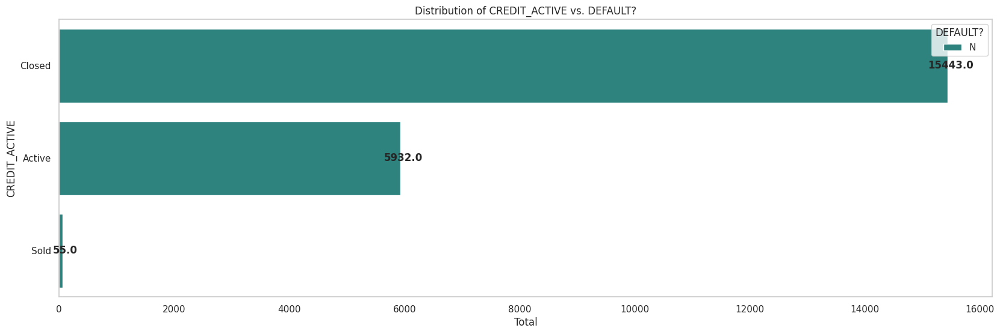

In [ ]:
group_columns = [
    'NAME_CONTRACT_TYPE',
    'NAME_TYPE_SUITE',
    'NAME_INCOME_TYPE',
    'NAME_HOUSING_TYPE',
    'OCCUPATION_TYPE',
    'ORGANIZATION_TYPE',
    'STATUS',
    'CREDIT_TYPE',
    'CREDIT_CURRENCY',
    'CREDIT_ACTIVE'
]

# Tambahkan kolom 'DEFAULT?' ke dalam daftar kolom
group_columns.append('DEFAULT?')

# Filter DataFrame hanya untuk kolom yang diinginkan
group_df_safe = df_safe[group_columns]

# Membuat plot untuk setiap kolom
for col in group_columns[:-1]:  # Exclude 'DEFAULT?' from grouping
    plt.figure(figsize=(20, 6))
    ax = sns.countplot(y=col, hue='DEFAULT?', data=group_df_safe, palette='viridis')  # Menggunakan palet warna 'viridis'
    plt.title(f'Distribution of {col} vs. DEFAULT?')
    plt.xlabel('Total')  # Label sumbu x
    plt.ylabel(col)  # Label sumbu y
    plt.legend(title='DEFAULT?', loc='upper right')  # Menambahkan legenda
    plt.grid(False)

    # Menambahkan anotasi jumlah pada setiap bar
    for p in ax.patches:
        ax.annotate(f'{p.get_width()}', (p.get_width() + 50, p.get_y() + p.get_height() / 2), ha='center', va='center',weight='bold')
    plt.grid(False)
    plt.show()

##**Default**

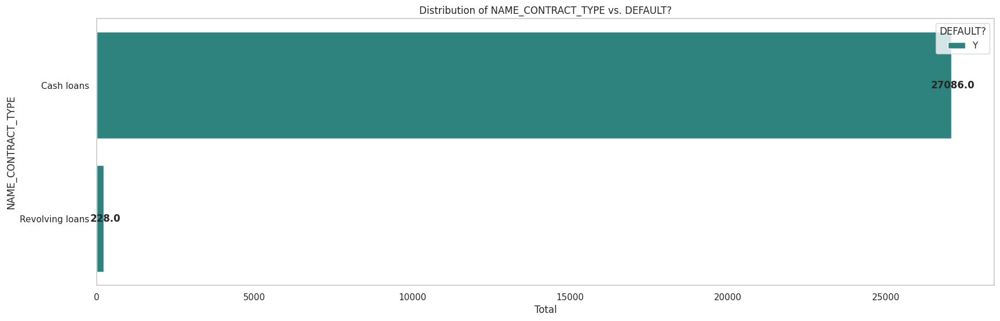

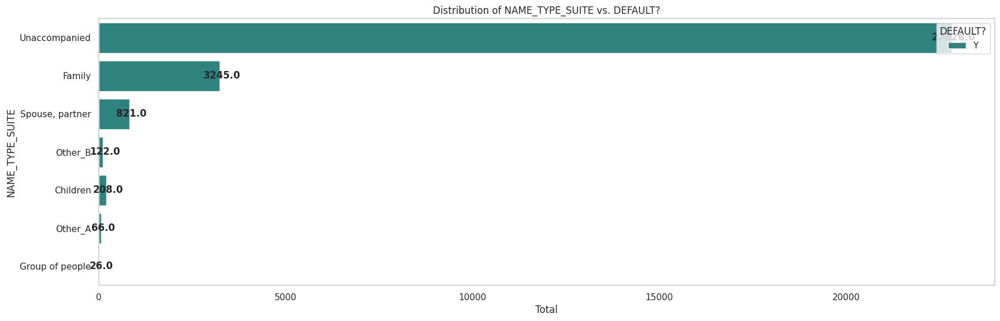

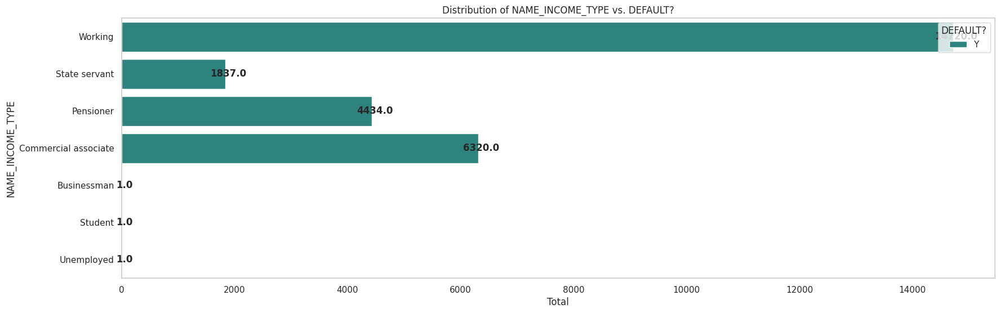

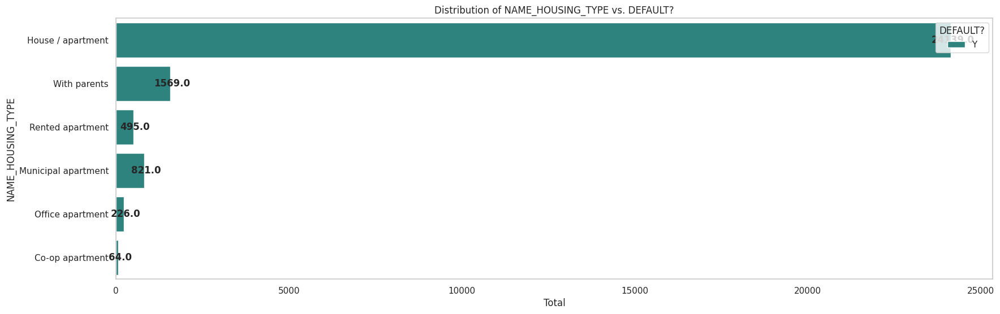

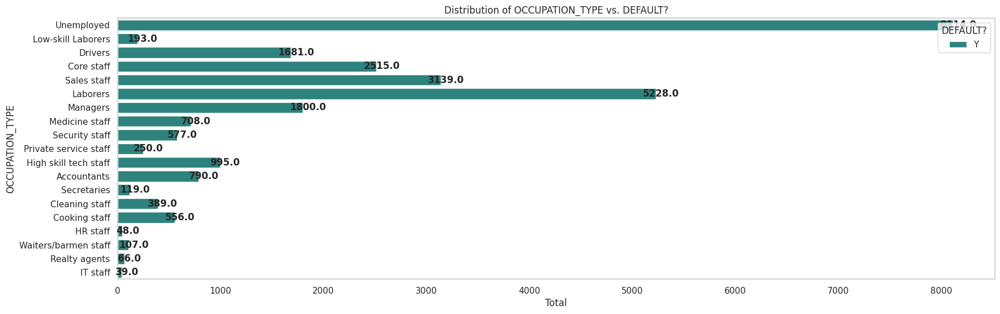

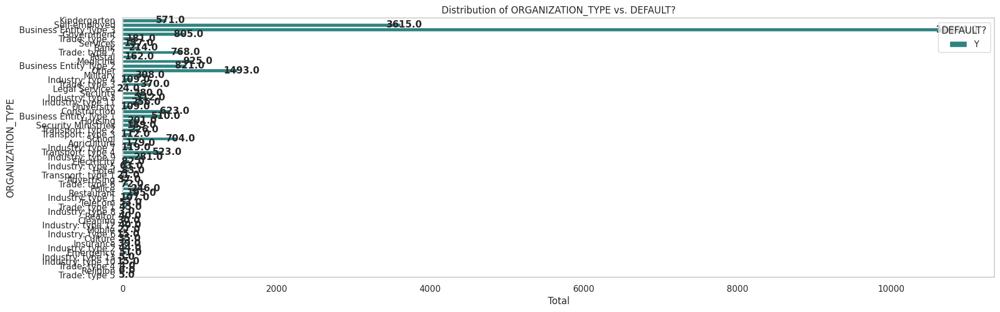

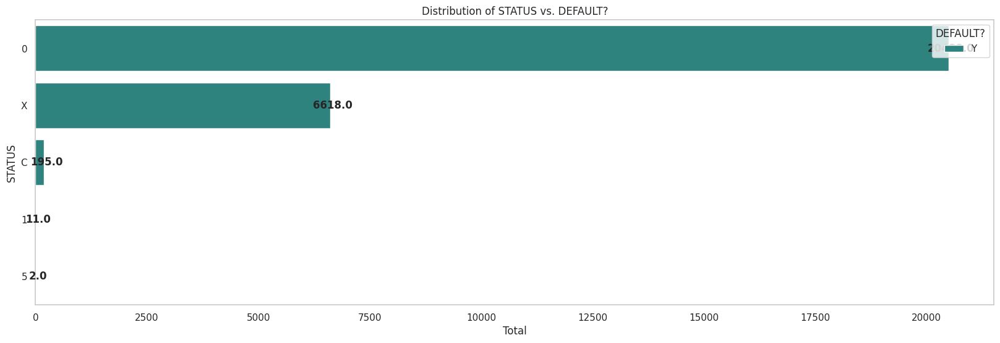

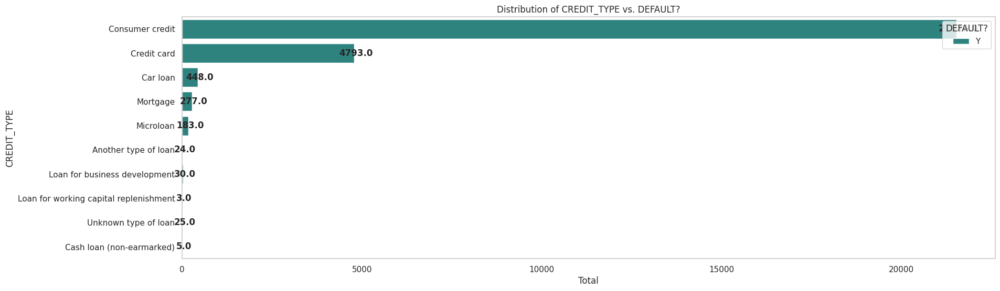

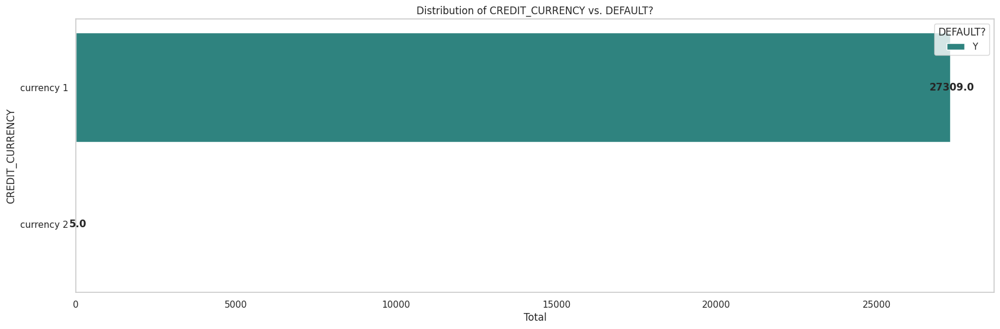

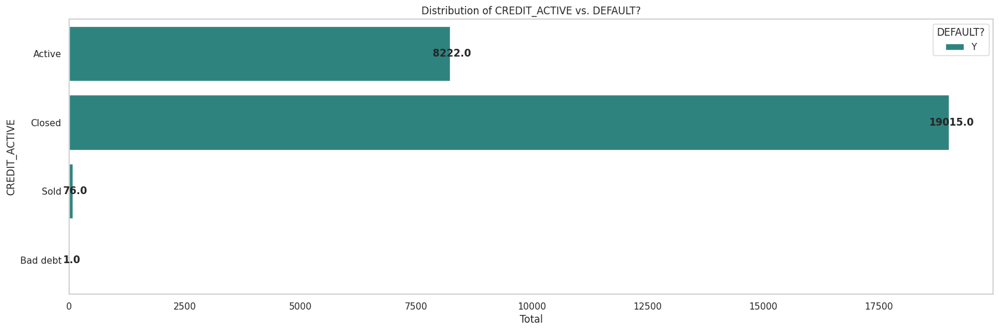

In [ ]:
group_columns = [
    'NAME_CONTRACT_TYPE',
    'NAME_TYPE_SUITE',
    'NAME_INCOME_TYPE',
    'NAME_HOUSING_TYPE',
    'OCCUPATION_TYPE',
    'ORGANIZATION_TYPE',
    'STATUS',
    'CREDIT_TYPE',
    'CREDIT_CURRENCY',
    'CREDIT_ACTIVE'
]

# Tambahkan kolom 'DEFAULT?' ke dalam daftar kolom
group_columns.append('DEFAULT?')

# Filter DataFrame hanya untuk kolom yang diinginkan
group_df_def = df_def[group_columns]

# Membuat plot untuk setiap kolom
for col in group_columns[:-1]:  # Exclude 'DEFAULT?' from grouping
    plt.figure(figsize=(20, 6))
    ax = sns.countplot(y=col, hue='DEFAULT?', data=group_df_def, palette='viridis')  # Menggunakan palet warna 'viridis'
    plt.title(f'Distribution of {col} vs. DEFAULT?')
    plt.xlabel('Total')  # Label sumbu x
    plt.ylabel(col)  # Label sumbu y
    plt.legend(title='DEFAULT?', loc='upper right')  # Menambahkan legenda
    plt.grid(False)

    # Menambahkan anotasi jumlah pada setiap bar
    for p in ax.patches:
        ax.annotate(f'{p.get_width()}', (p.get_width() + 50, p.get_y() + p.get_height() / 2), ha='center', va='center',weight='bold')
    plt.grid(False)
    plt.show()

##**Binary Plot**

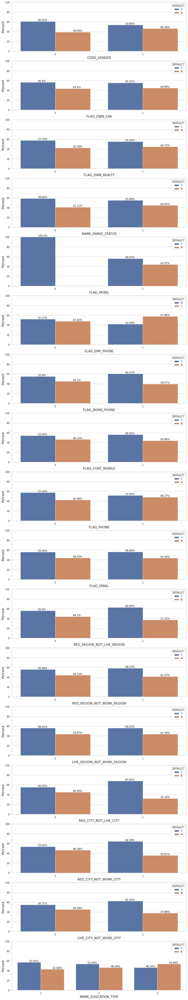

In [ ]:
sns.set(style="whitegrid", color_codes=True)
fig, axes = plt.subplots(ncols=1, nrows = len(bcol), figsize = (15,5*len(bcol)))
i = 0
for x in bcol:
    d = df_trained.groupby(x)['DEFAULT?'].value_counts(normalize=True).mul(100).rename('Percentage').reset_index()
    g = sns.barplot(x=x,y='Percentage',hue='DEFAULT?', data=d, ax=axes[i])     # Create bar chart
    g.set_ylim(0,100)
    g.set_xlabel(x,fontsize=15)
    g.set_ylabel("Percent",fontsize=15)
    i += 1
    for p in g.patches:
        txt = str(p.get_height().round(2)) + '%'
        txt_x = p.get_x() + p.get_width()/2
        txt_y = p.get_height()
        g.text(txt_x,txt_y+1,txt)        # Printing percentages on the bars

plt.grid(False)
plt.show(fig)

In [ ]:
df_trained.groupby('NAME_INCOME_TYPE')['SK_ID_CURR'].count()

NAME_INCOME_TYPE
Businessman                 1
Commercial associate    11402
Pensioner                9273
State servant            3532
Student                     2
Unemployed                  1
Working                 24533
Name: SK_ID_CURR, dtype: int64

In [ ]:
df_trained.groupby('OCCUPATION_TYPE')['SK_ID_CURR'].count()

OCCUPATION_TYPE
Accountants               1628
Cleaning staff             656
Cooking staff              894
Core staff                4361
Drivers                   2773
HR staff                   104
High skill tech staff     1854
IT staff                    81
Laborers                  8655
Low-skill Laborers         272
Managers                  3574
Medicine staff            1316
Private service staff      455
Realty agents              138
Sales staff               5072
Secretaries                213
Security staff             915
Unemployed               15605
Waiters/barmen staff       178
Name: SK_ID_CURR, dtype: int64

In [ ]:
pd.set_option('display.max_rows', None)
print(df_trained.groupby('NAME_INCOME_TYPE')['AGE'].value_counts())

NAME_INCOME_TYPE      AGE 
Businessman           33.0      1
Commercial associate  40.0    417
                      39.0    416
                      37.0    404
                      32.0    397
                      46.0    384
                      29.0    382
                      33.0    382
                      38.0    375
                      28.0    372
                      36.0    371
                      41.0    363
                      34.0    356
                      49.0    354
                      35.0    352
                      45.0    352
                      42.0    349
                      44.0    349
                      30.0    344
                      31.0    344
                      43.0    335
                      47.0    330
                      50.0    314
                      48.0    298
                      52.0    283
                      51.0    278
                      53.0    265
                      27.0    260
                     

In [ ]:
df_trained.groupby('NAME_EDUCATION_TYPE')['OCCUPATION_TYPE'].value_counts()

NAME_EDUCATION_TYPE  OCCUPATION_TYPE      
1                    Unemployed               11658
                     Laborers                  7300
                     Sales staff               3896
                     Drivers                   2374
                     Core staff                1934
                     Managers                  1463
                     Medicine staff            1114
                     High skill tech staff      980
                     Cooking staff              808
                     Security staff             764
                     Cleaning staff             599
                     Accountants                570
                     Private service staff      357
                     Low-skill Laborers         259
                     Waiters/barmen staff       136
                     Secretaries                119
                     Realty agents               81
                     HR staff                    36
                     

In [ ]:
medianf = df_trained['CNT_FAM_MEMBERS'].median()
df_trained.groupby('NAME_FAMILY_STATUS')['CNT_FAM_MEMBERS'].value_counts()

NAME_FAMILY_STATUS  CNT_FAM_MEMBERS
0                   1.0                10251
                    2.0                 1620
                    3.0                  289
                    4.0                   30
                    5.0                    7
                    6.0                    1
                    7.0                    1
                    21.0                   1
1                   2.0                24434
                    3.0                 7884
                    4.0                 3660
                    5.0                  505
                    6.0                   42
                    7.0                   11
                    10.0                   3
                    8.0                    2
                    13.0                   2
                    9.0                    1
Name: CNT_FAM_MEMBERS, dtype: int64

In [ ]:
df_trained['CNT_FAM_MEMBERS'].unique()

array([ 2.,  4.,  3.,  1.,  5., 10.,  6.,  7.,  8.,  9., 21., 13.])

In [ ]:
df_trained.groupby('NAME_FAMILY_STATUS')['AMT_INCOME_TOTAL'].mean()

NAME_FAMILY_STATUS
0    175232.484590
1    179499.880489
Name: AMT_INCOME_TOTAL, dtype: float64

##**Number plot**

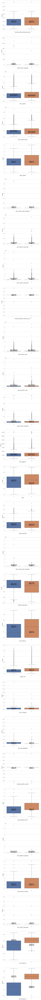

In [ ]:
sns.set(style="whitegrid")
fig, axes = plt.subplots(ncols=1, nrows = len(mcol), figsize = (10,10*len(mcol)))
i = 0
plt.grid(False)
for x in mcol:
    g = sns.boxplot(x='DEFAULT?',y=x,data=df_trained, ax=axes[i])
    g.set_xlabel(x,fontsize=15)
    g.set_ylabel("Count",fontsize=15)
    i += 1
    means = df_trained.groupby('DEFAULT?')[x].mean()
    medians = df_trained.groupby('DEFAULT?')[x].median()
    vertical_offset = df_trained[x].mean() *.05
    for xtick in g.get_xticks():
        g.text(xtick,medians[xtick]-vertical_offset,"Mean:"+str(round(means[xtick],2))+'\n'+"Median:"+str(round(medians[xtick],2)), horizontalalignment='center', color='black', weight='semibold')

plt.grid(False)
plt.show(fig)